# Business Problem

An education company named X Education sells online courses to industry professionals. Many professionals who are interested in the courses land on their website and browse for courses. A person who provides details line an email id or phone number becomes a lead. The sales team starts pursuing the lead hoping that they enroll in one of the programs by X Education. X Education has very poor conversion of leads which is aroung 30%. The company wants an efficient process to identify potential leads who will most likely enroll so that the sales team can focus on those leads. 

## Goal of the Case Study

To create an efficient process where a potential lead can be identified who will most likely enroll in one of X Education's courses.
Sales team can focus and pursue on the hot leads.
Target lead conversion rate to be around 80%.

## Step 1 : Importing Libraries

In [1]:
# Importing basic libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Library for warnings
import warnings
warnings.filterwarnings("ignore")

In [3]:
# Libraries to build model,split and scale data
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression

# For calculation of various metrics
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_recall_curve

from sklearn.preprocessing import PolynomialFeatures
from sklearn.feature_selection import RFE

import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

## Step 2 : Data Understanding

In [4]:
# Read the csv file to a dataframe
df_lead = pd.read_csv(r"Leads.csv")

In [5]:
# Check the dataframe
df_lead.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,...,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,No,0,0.0,0,0.0,...,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,No,0,5.0,674,2.5,...,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,...,No,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,No,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,...,No,Select,Mumbai,02.Medium,01.High,13.0,17.0,No,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,...,No,Select,Mumbai,02.Medium,01.High,15.0,18.0,No,No,Modified


In [6]:
# Shape of the dataframe
df_lead.shape

(9240, 37)

In [7]:
# Info of the dataframe
df_lead.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 37 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Prospect ID                                    9240 non-null   object 
 1   Lead Number                                    9240 non-null   int64  
 2   Lead Origin                                    9240 non-null   object 
 3   Lead Source                                    9204 non-null   object 
 4   Do Not Email                                   9240 non-null   object 
 5   Do Not Call                                    9240 non-null   object 
 6   Converted                                      9240 non-null   int64  
 7   TotalVisits                                    9103 non-null   float64
 8   Total Time Spent on Website                    9240 non-null   int64  
 9   Page Views Per Visit                           9103 

In [8]:
# Statistical analysis of the data frame
df_lead.describe()

,Lead Number,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Asymmetrique Activity Score,Asymmetrique Profile Score
count,9240.000000,9240.000000,9103.000000,9240.000000,9103.000000,5022.000000,5022.000000
mean,617188.435606,0.385390,3.445238,487.698268,2.362820,14.306252,16.344883
std,23405.995698,0.486714,4.854853,548.021466,2.161418,1.386694,1.811395
min,579533.000000,0.000000,0.000000,0.000000,0.000000,7.000000,11.000000
25%,596484.500000,0.000000,1.000000,12.000000,1.000000,14.000000,15.000000
50%,615479.000000,0.000000,3.000000,248.000000,2.000000,14.000000,16.000000
75%,637387.250000,1.000000,5.000000,936.000000,3.000000,15.000000,18.000000
max,660737.000000,1.000000,251.000000,2272.000000,55.000000,18.000000,20.000000


Observation: 
1. There are lot of missing values
2. Some columns have the value "Select" which means the user has not selected any option
3. There are 9240 entries with 37 columns
4. 30 are categorical columns 7 are numerical columns
    

## Step 3: Data Clean up and preparation 

###### Checking for duplicate values

In [9]:
df_lead[df_lead.duplicated()]

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,...,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity


Observation: 
There are no duplicated values

#### Checking for null values

In [10]:
# Checking for the null values in the data frame
df_lead.isnull().sum()

Prospect ID                                         0
Lead Number                                         0
Lead Origin                                         0
Lead Source                                        36
Do Not Email                                        0
Do Not Call                                         0
Converted                                           0
TotalVisits                                       137
Total Time Spent on Website                         0
Page Views Per Visit                              137
Last Activity                                     103
Country                                          2461
Specialization                                   1438
How did you hear about X Education               2207
What is your current occupation                  2690
What matters most to you in choosing a course    2709
Search                                              0
Magazine                                            0
Newspaper Article           

In [11]:
# Checking null values in terms of percentage
round(df_lead.isnull().sum()/df_lead.shape[0],2)*100

Prospect ID                                       0.0
Lead Number                                       0.0
Lead Origin                                       0.0
Lead Source                                       0.0
Do Not Email                                      0.0
Do Not Call                                       0.0
Converted                                         0.0
TotalVisits                                       1.0
Total Time Spent on Website                       0.0
Page Views Per Visit                              1.0
Last Activity                                     1.0
Country                                          27.0
Specialization                                   16.0
How did you hear about X Education               24.0
What is your current occupation                  29.0
What matters most to you in choosing a course    29.0
Search                                            0.0
Magazine                                          0.0
Newspaper Article           

###### Observation:Some of the columns have missing values

###### Dropping Columns with null values greater than 33%

In [12]:
# Dropping columns which have null values more then 33%
col = ['Lead Quality', 'Lead Profile','Asymmetrique Activity Index','Tags',
       'Asymmetrique Profile Index','Asymmetrique Activity Score','Asymmetrique Profile Score']

In [13]:
# Dropping the columns 
df_lead.drop(col,axis = 1, inplace = True)

In [14]:
# Checking the shape and columns of the dataframe after dropping few columns
print("Shape:",df_lead.shape)
print("Columns: \n",df_lead.columns)

Shape: (9240, 30)
Columns: 
 Index(['Prospect ID', 'Lead Number', 'Lead Origin', 'Lead Source',
       'Do Not Email', 'Do Not Call', 'Converted', 'TotalVisits',
       'Total Time Spent on Website', 'Page Views Per Visit', 'Last Activity',
       'Country', 'Specialization', 'How did you hear about X Education',
       'What is your current occupation',
       'What matters most to you in choosing a course', 'Search', 'Magazine',
       'Newspaper Article', 'X Education Forums', 'Newspaper',
       'Digital Advertisement', 'Through Recommendations',
       'Receive More Updates About Our Courses',
       'Update me on Supply Chain Content', 'Get updates on DM Content',
       'City', 'I agree to pay the amount through cheque',
       'A free copy of Mastering The Interview', 'Last Notable Activity'],
      dtype='object')


In [15]:
# Checking the number of values for each column
df_lead.nunique()

Prospect ID                                      9240
Lead Number                                      9240
Lead Origin                                         5
Lead Source                                        21
Do Not Email                                        2
Do Not Call                                         2
Converted                                           2
TotalVisits                                        41
Total Time Spent on Website                      1731
Page Views Per Visit                              114
Last Activity                                      17
Country                                            38
Specialization                                     19
How did you hear about X Education                 10
What is your current occupation                     6
What matters most to you in choosing a course       3
Search                                              2
Magazine                                            1
Newspaper Article           

Observation:
Prospect Id and Lead Number columns have all 9240 unique values. 

Dropping these columns as they will not help in the analysis as they are just an identifier for the row.

In [16]:
# Dropping the columns Prospect ID and Lead Number
df_lead.drop(["Prospect ID","Lead Number"], axis = 1, inplace = True)

In [17]:
# Checking the shape of the datafram after dropping the columns
print(df_lead.shape)

(9240, 28)


Checking the value counts of the categorical variables to handle "Select" values

In [18]:
# Creating a list of categorical columns
cat_col = df_lead.select_dtypes(include = "object").columns
cat_col

Index(['Lead Origin', 'Lead Source', 'Do Not Email', 'Do Not Call',
       'Last Activity', 'Country', 'Specialization',
       'How did you hear about X Education', 'What is your current occupation',
       'What matters most to you in choosing a course', 'Search', 'Magazine',
       'Newspaper Article', 'X Education Forums', 'Newspaper',
       'Digital Advertisement', 'Through Recommendations',
       'Receive More Updates About Our Courses',
       'Update me on Supply Chain Content', 'Get updates on DM Content',
       'City', 'I agree to pay the amount through cheque',
       'A free copy of Mastering The Interview', 'Last Notable Activity'],
      dtype='object')

In [19]:
# Checking value counts of "Select" and Null values in the categorical columns
for i in cat_col:
    print(i)
    print(df_lead[i].value_counts(dropna = False, ascending = False))
    print("---------------------------------------------------------------")

Lead Origin
Landing Page Submission    4886
API                        3580
Lead Add Form               718
Lead Import                  55
Quick Add Form                1
Name: Lead Origin, dtype: int64
---------------------------------------------------------------
Lead Source
Google               2868
Direct Traffic       2543
Olark Chat           1755
Organic Search       1154
Reference             534
Welingak Website      142
Referral Sites        125
Facebook               55
NaN                    36
bing                    6
google                  5
Click2call              4
Press_Release           2
Social Media            2
Live Chat               2
youtubechannel          1
testone                 1
Pay per Click Ads       1
welearnblog_Home        1
WeLearn                 1
blog                    1
NC_EDM                  1
Name: Lead Source, dtype: int64
---------------------------------------------------------------
Do Not Email
No     8506
Yes     734
Name: Do Not Em

Observation:
1. Column: Lead Source: has 36 null values -- (Action: Delete the rows with null values)
2. Column: Last Activity: has 103 null values -- (Action: Delete the rows with null values)
3. Column: Country: has 2461 null values -- (Action: Drop the column as imputing so many null values                                          can result in incorrect prediction and deleting so many                                              rows might educe the number of rows significantly)
4. Column: City: has 2249 "Select" values and 1420 null values -- (Action: Delete the rows with null
values)
5. Column: "How did you hear about X Education" has 5403 Select values and 2207 null values. Hence dropping the column

In [20]:
# Dropping city, Country and How did you hear about X Education columns
df_lead.drop(["Country","City","How did you hear about X Education"], axis = 1, inplace = True)

# Checking the shape of the dataframe after the drop
df_lead.shape

(9240, 25)

In [21]:
# Deleting the rows with null values in column Lead Source 
df_lead = df_lead[~df_lead["Lead Source"].isnull()]

# Deleting the rows with null values in column Last Activity
df_lead = df_lead[~df_lead["Last Activity"].isnull()]

In [22]:
# Verifying if the rows are deleted
df_lead.shape

(9103, 25)

In [23]:
# Again replacing the list with the present categorical columns
cat_col = df_lead.select_dtypes(include = "object").columns
cat_col

Index(['Lead Origin', 'Lead Source', 'Do Not Email', 'Do Not Call',
       'Last Activity', 'Specialization', 'What is your current occupation',
       'What matters most to you in choosing a course', 'Search', 'Magazine',
       'Newspaper Article', 'X Education Forums', 'Newspaper',
       'Digital Advertisement', 'Through Recommendations',
       'Receive More Updates About Our Courses',
       'Update me on Supply Chain Content', 'Get updates on DM Content',
       'I agree to pay the amount through cheque',
       'A free copy of Mastering The Interview', 'Last Notable Activity'],
      dtype='object')

#### Visualizing the Categorical columns in count plot

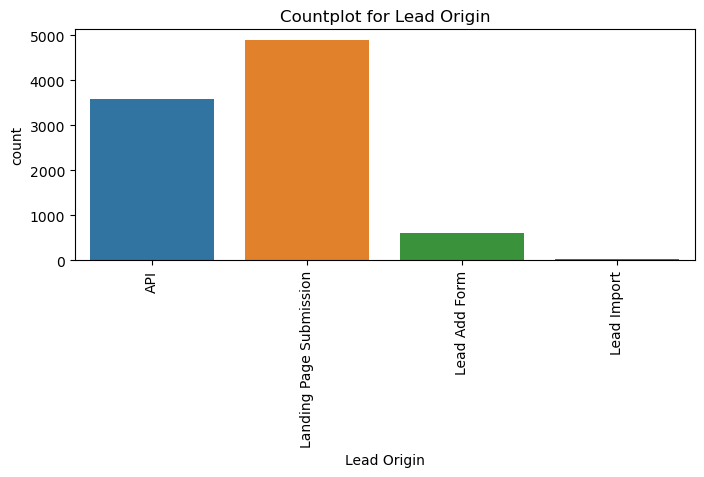

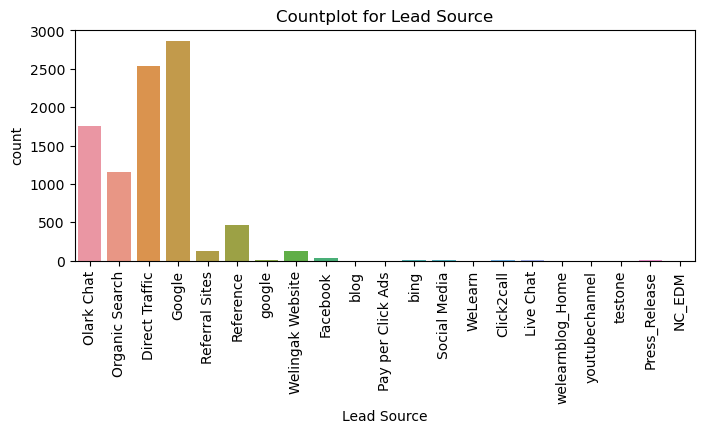

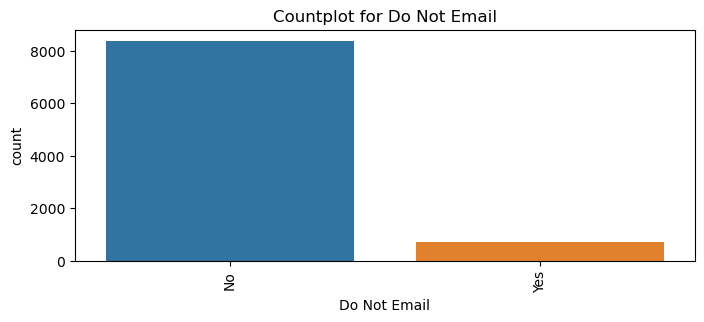

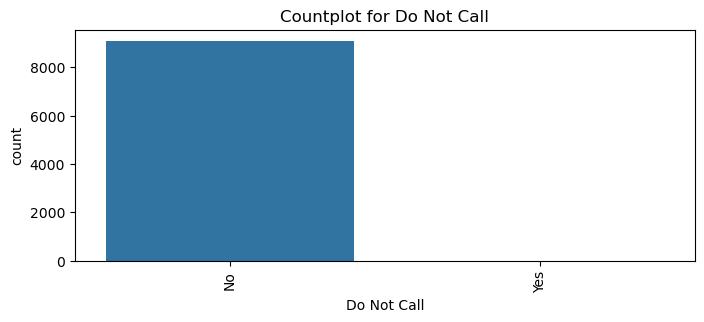

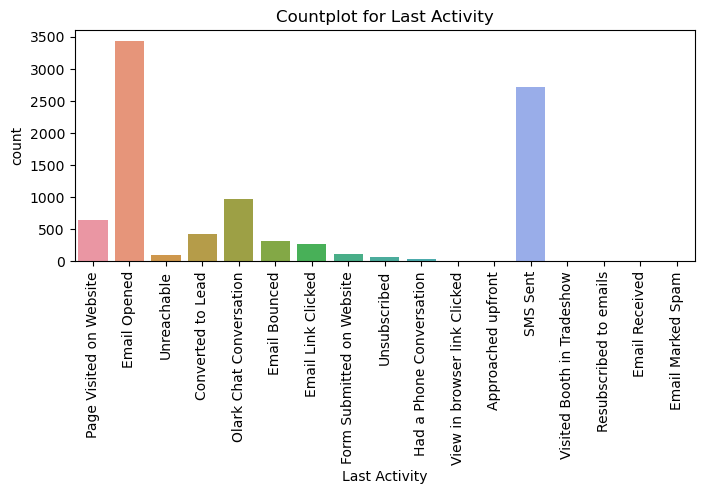

...

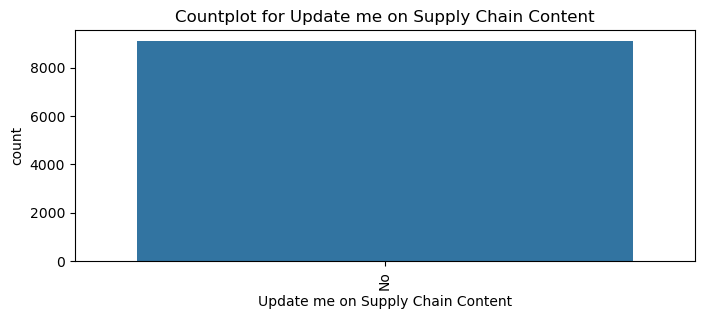

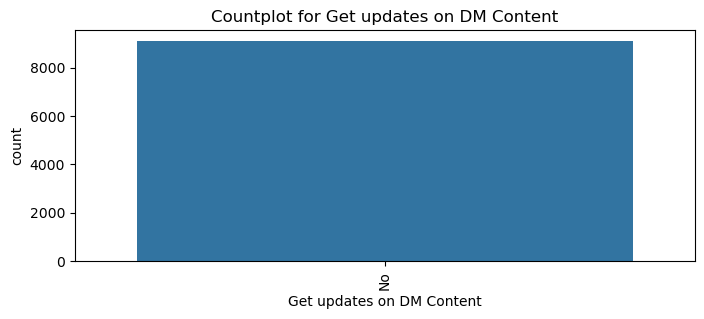

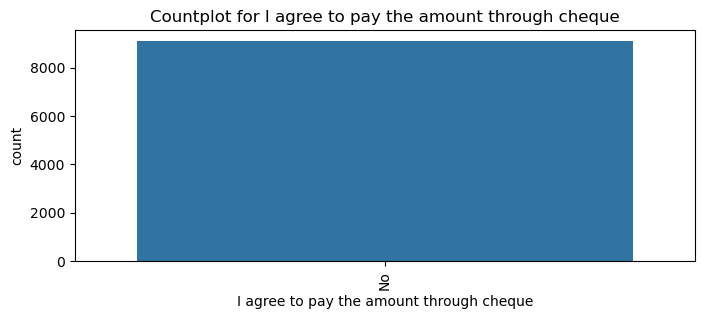

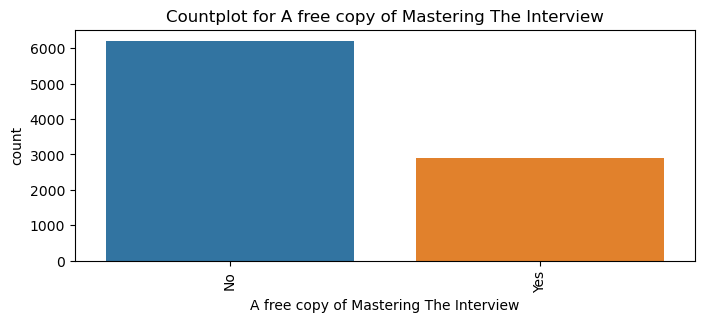

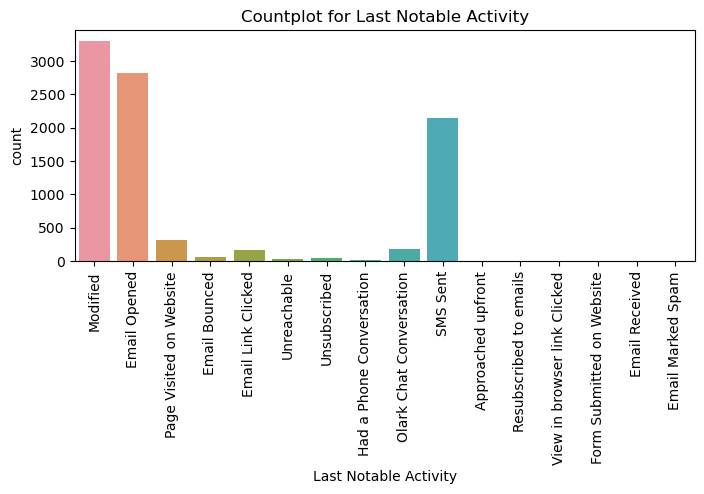

In [24]:
# Count plot for Categorical columns
for i in cat_col:
    plt.figure(figsize = (8,3))
    sns.countplot(data = df_lead, x = df_lead[i])
    plt.title("Countplot for "+i)
    plt.xticks(rotation = 90)
    plt.show()

Observation: Many columns have a single value which accounts for most of the value count for that
column.

Hence dropping those columns as they will not provide any insight for our analysis

In [25]:
# Creating a list of columns to be dropped
col_drop = ['Do Not Email', 'Do Not Call','Search', 'Magazine','Newspaper Article', 
            'X Education Forums', 'Newspaper', 'Digital Advertisement', 
            'Through Recommendations','Receive More Updates About Our Courses', 
            'Update me on Supply Chain Content', 'Get updates on DM Content',
            'I agree to pay the amount through cheque']

In [26]:
# Dropping columns
df_lead.drop(col_drop,axis=1,inplace=True)

# Verifying the shape of the data frame
df_lead.shape

(9103, 12)

In [27]:
# Checking for null values again
df_lead.isnull().sum()

Lead Origin                                         0
Lead Source                                         0
Converted                                           0
TotalVisits                                        29
Total Time Spent on Website                         0
Page Views Per Visit                               29
Last Activity                                       0
Specialization                                   1438
What is your current occupation                  2690
What matters most to you in choosing a course    2709
A free copy of Mastering The Interview              0
Last Notable Activity                               0
dtype: int64

Observation:
Null values still present

Action: Delete the rows in case of columns having low number of null values

In [28]:
# Deleting the rows with null values in column TotalVisits 
df_lead = df_lead[~df_lead["TotalVisits"].isnull()]

In [29]:
# Verify the number of rows
df_lead.shape

(9074, 12)

In [30]:
# Check for null values again
df_lead.isnull().sum()

Lead Origin                                         0
Lead Source                                         0
Converted                                           0
TotalVisits                                         0
Total Time Spent on Website                         0
Page Views Per Visit                                0
Last Activity                                       0
Specialization                                   1431
What is your current occupation                  2683
What matters most to you in choosing a course    2702
A free copy of Mastering The Interview              0
Last Notable Activity                               0
dtype: int64

In [31]:
# Function for checking the value counts
def valcnt(col):
    for i in col:
        print(i)
        print(df_lead[i].value_counts(dropna = False, ascending = False))
        print("---------------------------------------------------------------")

In [32]:
# Checking value counts for the columns with null values
col_null = ["Specialization","What is your current occupation","What matters most to you in choosing a course"]

# Using the function to display value counts
valcnt(col_null)

Specialization
Select                               1851
NaN                                  1431
Finance Management                    959
Human Resource Management             837
Marketing Management                  823
Operations Management                 499
Business Administration               399
IT Projects Management                366
Supply Chain Management               346
Banking, Investment And Insurance     335
Travel and Tourism                    202
Media and Advertising                 202
International Business                176
Healthcare Management                 156
E-COMMERCE                            111
Hospitality Management                111
Retail Management                     100
Rural and Agribusiness                 73
E-Business                             57
Services Excellence                    40
Name: Specialization, dtype: int64
---------------------------------------------------------------
What is your current occupation
Unemployed    

In [33]:
# Dropping the column What matters most to you in choosing a course 
# Since only one value is dominant and others are almost non existant
df_lead.drop(["What matters most to you in choosing a course"], axis = 1, inplace = True)

In [34]:
# Verify the shape
df_lead.shape

(9074, 11)

Theer are "SELECT" values in few columns as the user has not chosen any option for it. This is 
equivalent to the null value. 

In [35]:
# Replacing Select with null values
df_lead = df_lead.replace("Select", np.nan)

In [36]:
# Checking value counts for the columns with null values
col_null = ["Specialization","What is your current occupation"]

# Using the function to display value counts
valcnt(col_null)

Specialization
NaN                                  3282
Finance Management                    959
Human Resource Management             837
Marketing Management                  823
Operations Management                 499
Business Administration               399
IT Projects Management                366
Supply Chain Management               346
Banking, Investment And Insurance     335
Travel and Tourism                    202
Media and Advertising                 202
International Business                176
Healthcare Management                 156
E-COMMERCE                            111
Hospitality Management                111
Retail Management                     100
Rural and Agribusiness                 73
E-Business                             57
Services Excellence                    40
Name: Specialization, dtype: int64
---------------------------------------------------------------
What is your current occupation
Unemployed              5476
NaN                     268

Deleteing null value rows will relut in data loss upto 40%.

And since specialization can be an important factor in a lead getting converted,
we shall replace the null values with "Others"

In [37]:
# Imputing null values in column Specialization with "Others"
df_lead["Specialization"] = df_lead["Specialization"].replace(np.nan, "Others")

In [38]:
# Verifying the value imputation (Not using the function here as it is only one column)
df_lead["Specialization"].value_counts()

Others                               3282
Finance Management                    959
Human Resource Management             837
Marketing Management                  823
Operations Management                 499
Business Administration               399
IT Projects Management                366
Supply Chain Management               346
Banking, Investment And Insurance     335
Travel and Tourism                    202
Media and Advertising                 202
International Business                176
Healthcare Management                 156
E-COMMERCE                            111
Hospitality Management                111
Retail Management                     100
Rural and Agribusiness                 73
E-Business                             57
Services Excellence                    40
Name: Specialization, dtype: int64

Imputing null values for "What is your current occupation" since this also might be an important factor in preding the lead getting converted.

In [39]:
# Imputing null values in column What is your current occupation with "No occupation chosen"
df_lead["What is your current occupation"] = df_lead["What is your current occupation"].replace(np.nan, "No Occupation chosen")

In [40]:
# Verifying the shape
df_lead.shape

(9074, 11)

In [41]:
# Checking for null values again
df_lead.isnull().sum()

Lead Origin                               0
Lead Source                               0
Converted                                 0
TotalVisits                               0
Total Time Spent on Website               0
Page Views Per Visit                      0
Last Activity                             0
Specialization                            0
What is your current occupation           0
A free copy of Mastering The Interview    0
Last Notable Activity                     0
dtype: int64

Now, there are no null values in the data frame.
The data frame previously had 9240 rows and now has 9074 rows which is not much data loss.

### Segmentation

Making 2 lists with column names. 1 list will have numerical columns and the other list will have categorical columns. This is to make analysis easier.

In [42]:
# Numerical Columns
num_col = df_lead.select_dtypes(include = ["int64","float64"]).columns

# Categorical Columns
cat_col = df_lead.select_dtypes(include = "object").columns

In [43]:
# Converting to list
cat_col = list(cat_col)
num_col = list(num_col)

In [44]:
# Checking the lists
print("Numerical columns: \n",num_col,'\n\n',"Categorical Columns:\n",cat_col)

Numerical columns: 
 ['Converted', 'TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit'] 

 Categorical Columns:
 ['Lead Origin', 'Lead Source', 'Last Activity', 'Specialization', 'What is your current occupation', 'A free copy of Mastering The Interview', 'Last Notable Activity']


### EDA and Data Visualization

#### Univariate Analysis

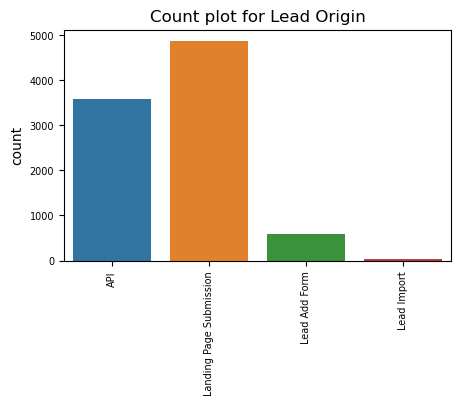

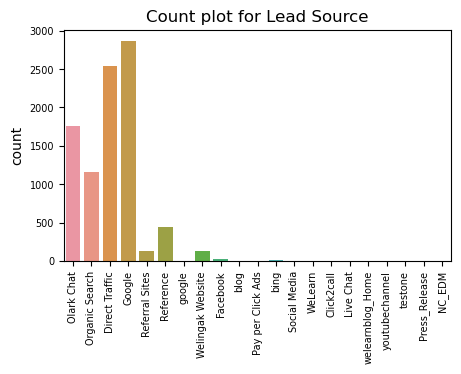

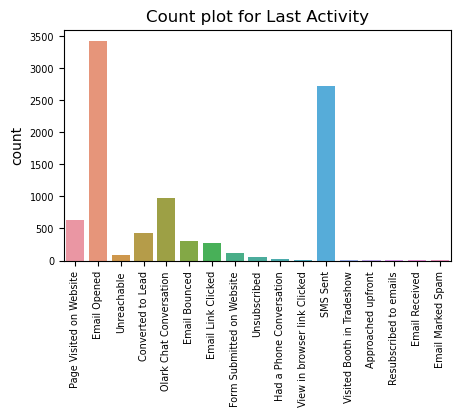

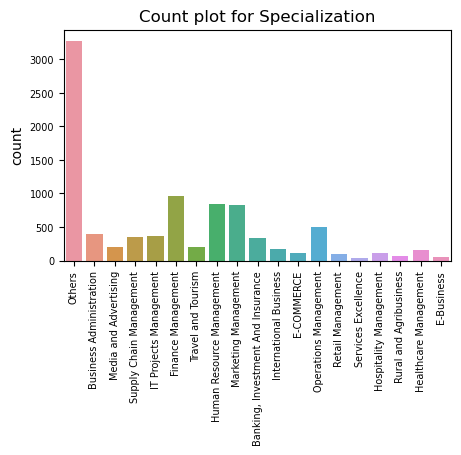

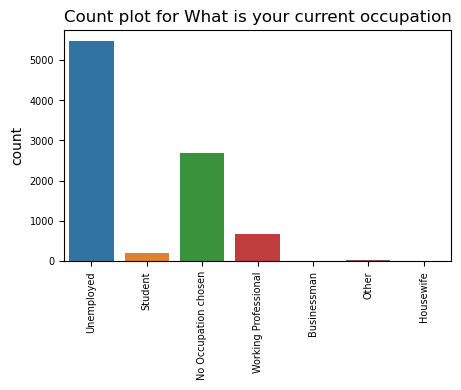

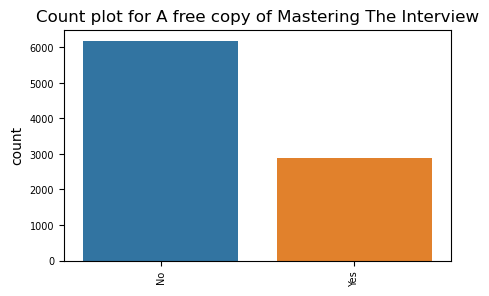

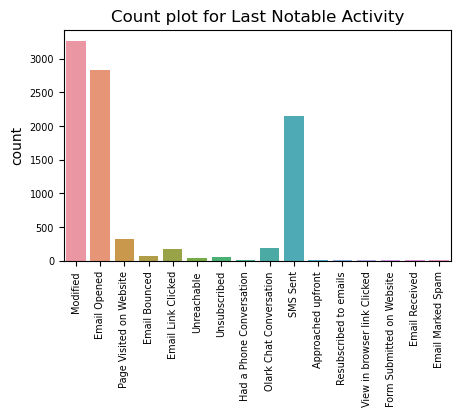

In [45]:
for i in cat_col:
    plt.figure(figsize = (5,3))
    ax = sns.countplot(data = df_lead, x = df_lead[i])
    ax.set(xlabel=None)
    plt.title ("Count plot for "+i)
    plt.xticks(rotation = 90)
    plt.tick_params(labelsize=7)
    plt.show()

###### Observation:
We can view the count of all the values in each column.
We shall analyse further in bivariate analysis.

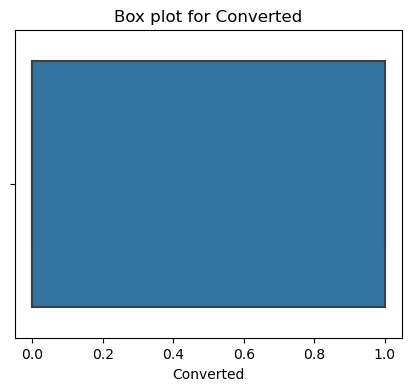

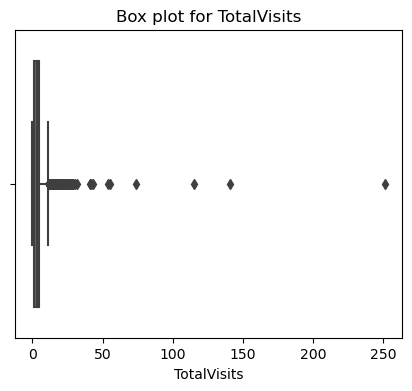

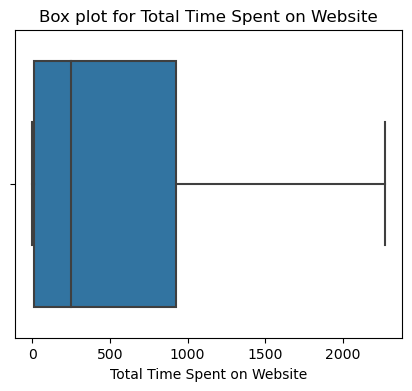

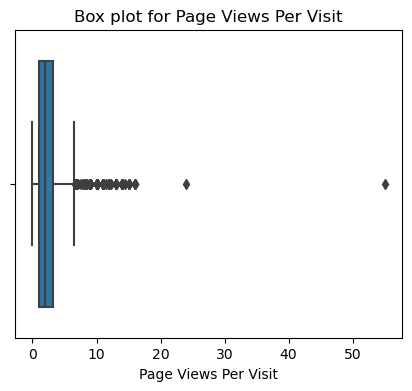

In [46]:
#Univariate analysis of numerical variables using box plot

for i in num_col:
    plt.figure(figsize=(5,4))
    sns.boxplot(data = df_lead, x = df_lead[i])
    plt.xlabel (i)
    plt.title("Box plot for "+i)
    plt.show()

###### Observation:
The columns "Total Visits" and "Page Views Per Visit" have outliers present. How ever the outliers are very minimal, we shall keep them.

In [47]:
#Outlier Analysis
df_lead[num_col].describe([0.25,0.3,0.4,0.5,0.6,0.7,0.8,0.9,0.91,0.92,0.94,0.96,0.97,0.98,0.99,1])

,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit
count,9074.000000,9074.000000,9074.000000,9074.000000
mean,0.378554,3.456028,482.887481,2.370151
std,0.485053,4.858802,545.256560,2.160871
min,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.000000,11.000000,1.000000
30%,0.000000,2.000000,55.000000,1.000000
40%,0.000000,2.000000,144.000000,2.000000
50%,0.000000,3.000000,246.000000,2.000000
60%,0.000000,3.000000,367.000000,2.500000
70%,1.000000,4.000000,693.000000,3.000000


There seem to be very minimal outliers in the numerical columns. I will keep this data.

#### Bivariate Analysis

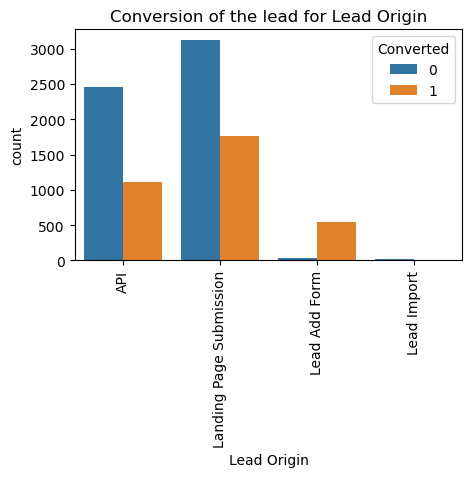

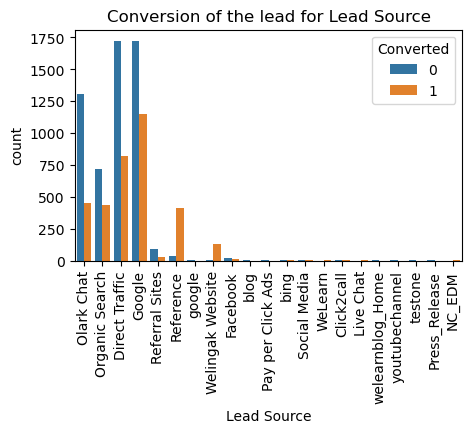

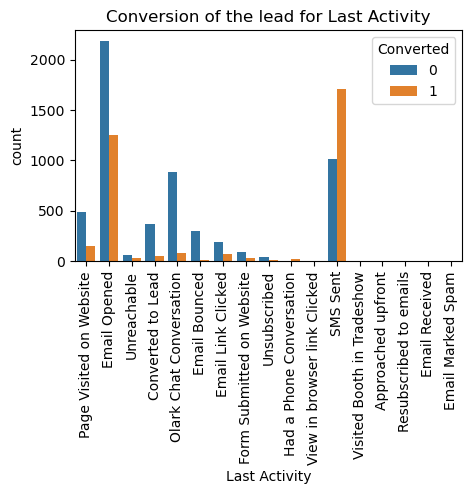

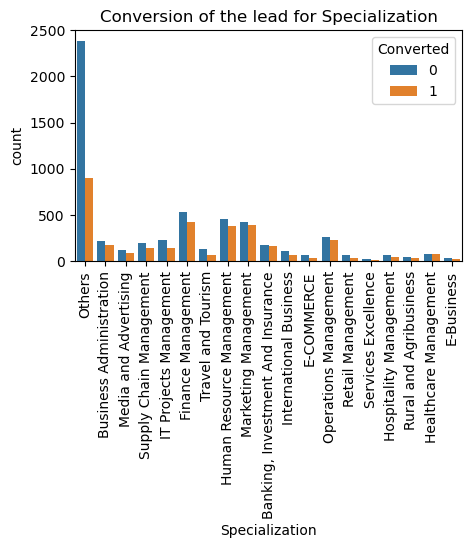

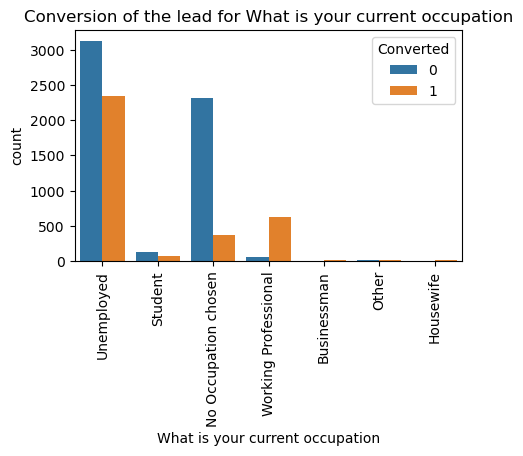

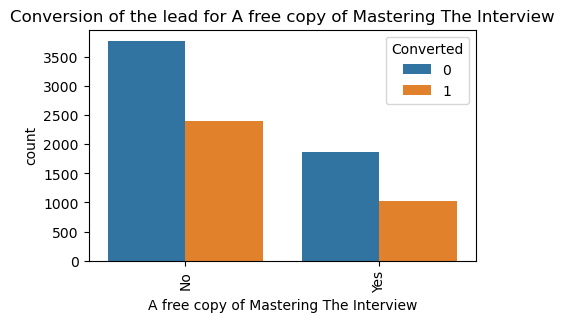

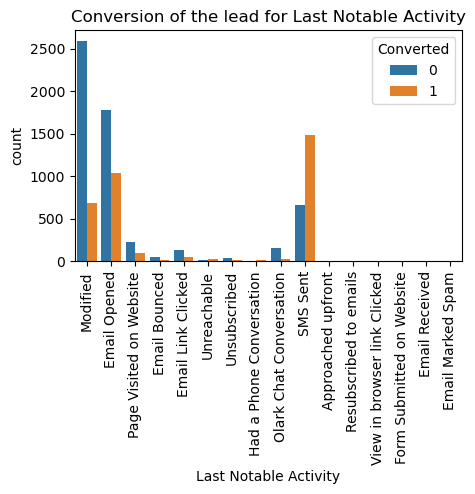

In [48]:
# Bivariate analysis for categorical columns against conversion
for i in cat_col:
    plt.figure(figsize =(5,3))
    sns.countplot(df_lead[i], hue = df_lead["Converted"])
    plt.xticks(rotation = 90)
    plt.legend(title = "Converted",loc = "upper right")
    plt.title("Conversion of the lead for "+i)
    plt.show()

Observation: 
1. Leads originated through "Add Forms" have a high probability of conversion
2. If the "Last Notable Activity" by the student is "SMS Sent", the probability of conversion is 
high
3. If the "Last Notable Activity" by the student is "Email Opened", the probability of conversion 
is lower
4. If the "Last Notable Activity" by the student is "Modified", the probability of not getting 
converted is high
6. A "Working Professional" is more likely to convert
7. A student with "Reference" (Lead Source) is highly likely to convert
8. Few of the Specializations are more likely to convert than the other categories of 
specializations.

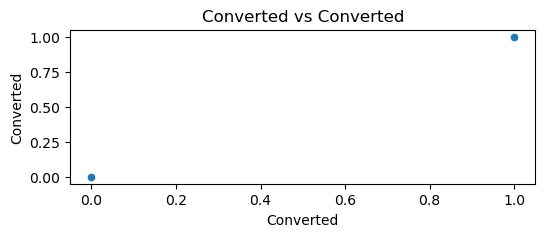

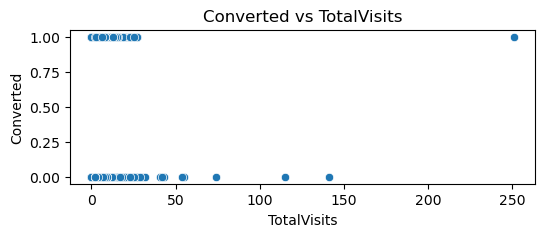

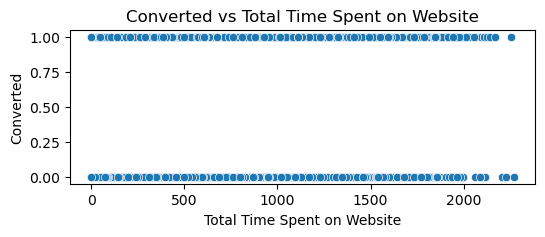

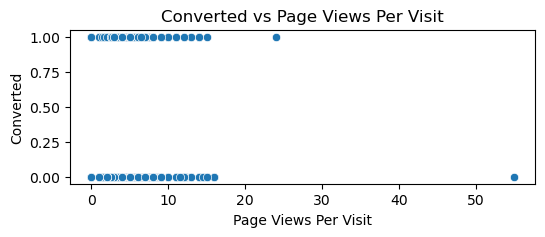

In [49]:
# Scatter plot for all the continuous numerical variables and cnt(target variable)
for i in num_col:
    plt.figure(figsize=(6,2))
    sns.scatterplot(data = df_lead, x = df_lead[i], y = df_lead["Converted"])
    plt.xlabel(i)
    plt.title("Converted vs "+i)
    plt.show()

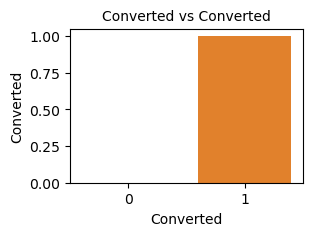

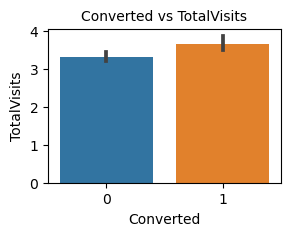

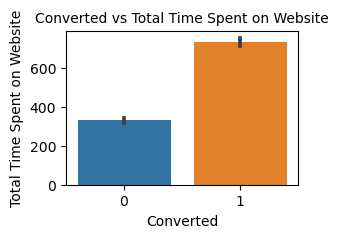

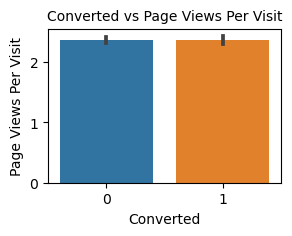

In [50]:
# Bar plot for numerical columns vs target variable
for i in num_col:
    plt.figure(figsize = (3,2))
    sns.barplot(data = df_lead, y = df_lead[i], x = "Converted")
    plt.title("Converted vs "+i, fontsize = 10)
    plt.show()

Observation:
1. People who spend more time on the website are likely to get converted
2. People who views more pages per visit are not likely to get converted

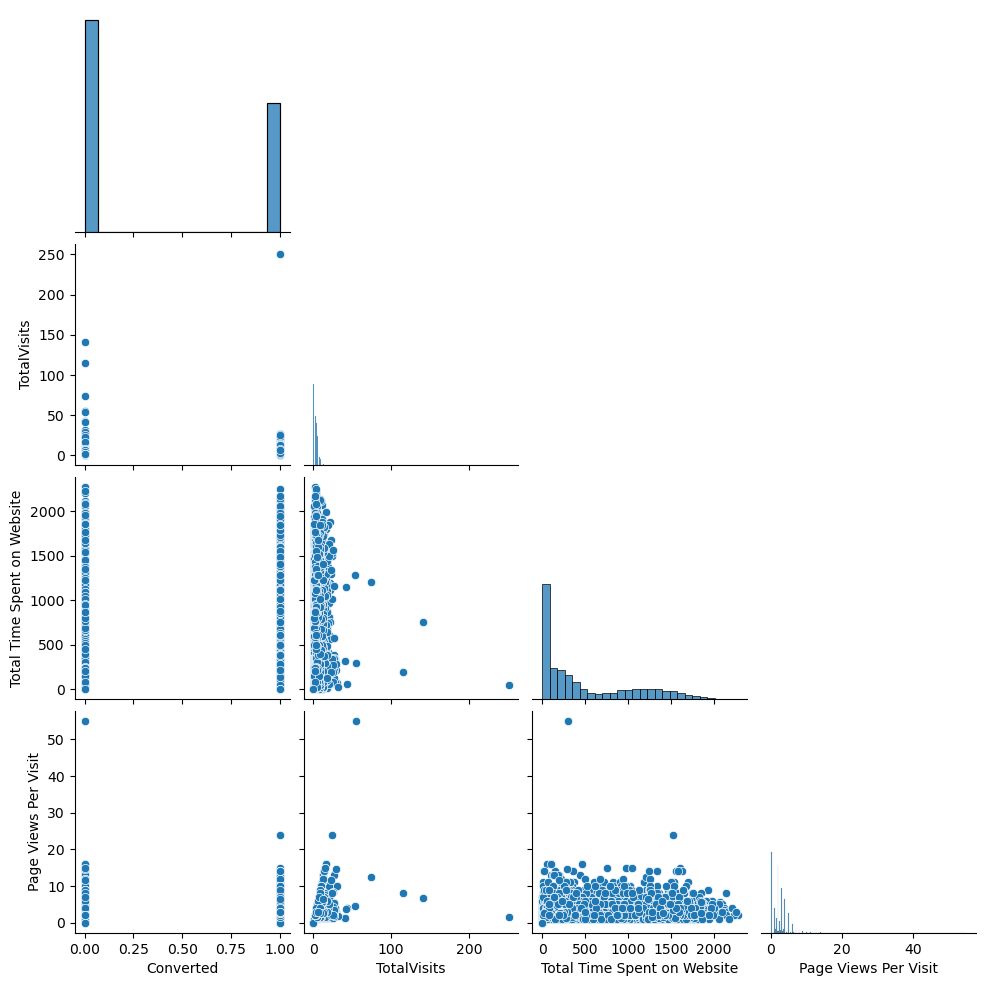

In [51]:
# Pair plot for the analysis of numerical variables
sns.pairplot(data = df_lead[num_col], corner = True)
plt.show()

Observation:
1. Total Visits and Page Views Per Visit shows a linear relationship.
2. As the Total Time Spent on Website increases, Page Views Per Visit seems to decrease

<AxesSubplot:>

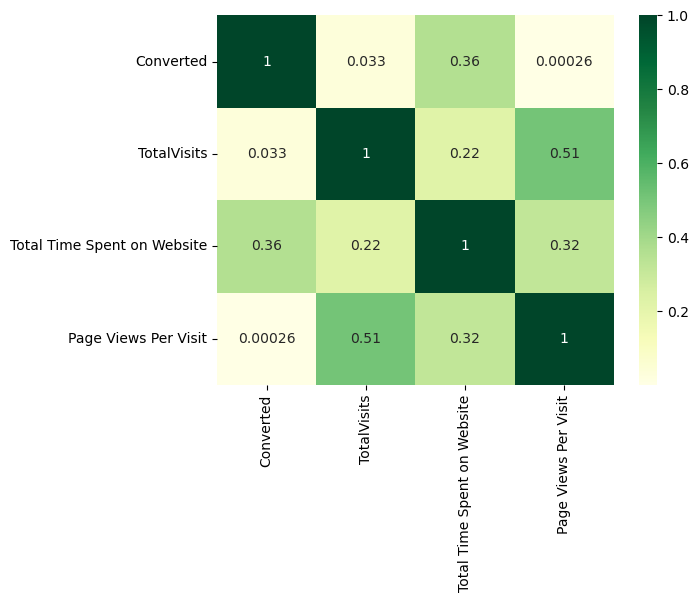

In [52]:
# Heat Map
sns.heatmap(df_lead.corr(),annot = True, cmap = "YlGn")

Observation:
1. Total Visits and Page Views Per Visit shows a positive linear relationship
2. Total Time Spent on Website shows a positive linear relationship to some extent (not high)
3. None of the variables have high correlation with other variables

The data is void of null values and the analysis of the features have been done.
Now, the data needs to be prepared for modelling.

#### Creation of dummy variables for the categorical Variables

In [53]:
# Checking the data types of the columns
df_lead.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9074 entries, 0 to 9239
Data columns (total 11 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Lead Origin                             9074 non-null   object 
 1   Lead Source                             9074 non-null   object 
 2   Converted                               9074 non-null   int64  
 3   TotalVisits                             9074 non-null   float64
 4   Total Time Spent on Website             9074 non-null   int64  
 5   Page Views Per Visit                    9074 non-null   float64
 6   Last Activity                           9074 non-null   object 
 7   Specialization                          9074 non-null   object 
 8   What is your current occupation         9074 non-null   object 
 9   A free copy of Mastering The Interview  9074 non-null   object 
 10  Last Notable Activity                   9074 non-null   obje

In [54]:
# Converting object data type to category data type
df_lead[cat_col] = df_lead[cat_col].astype("category")

# Verification
df_lead.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9074 entries, 0 to 9239
Data columns (total 11 columns):
 #   Column                                  Non-Null Count  Dtype   
---  ------                                  --------------  -----   
 0   Lead Origin                             9074 non-null   category
 1   Lead Source                             9074 non-null   category
 2   Converted                               9074 non-null   int64   
 3   TotalVisits                             9074 non-null   float64 
 4   Total Time Spent on Website             9074 non-null   int64   
 5   Page Views Per Visit                    9074 non-null   float64 
 6   Last Activity                           9074 non-null   category
 7   Specialization                          9074 non-null   category
 8   What is your current occupation         9074 non-null   category
 9   A free copy of Mastering The Interview  9074 non-null   category
 10  Last Notable Activity                   9074 non

Observation: The columns with object data type is converted to Category data type

In [55]:
# Creating dummy variables for these columns 
dummy_lead = pd.get_dummies(df_lead[cat_col],drop_first = True)

In [56]:
# Shape of the dataframe with dummy variables
dummy_lead.shape

(9074, 79)

In [57]:
# Info of the dataframe with dummy variables
dummy_lead.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9074 entries, 0 to 9239
Data columns (total 79 columns):
 #   Column                                                Non-Null Count  Dtype
---  ------                                                --------------  -----
 0   Lead Origin_Landing Page Submission                   9074 non-null   uint8
 1   Lead Origin_Lead Add Form                             9074 non-null   uint8
 2   Lead Origin_Lead Import                               9074 non-null   uint8
 3   Lead Source_Direct Traffic                            9074 non-null   uint8
 4   Lead Source_Facebook                                  9074 non-null   uint8
 5   Lead Source_Google                                    9074 non-null   uint8
 6   Lead Source_Live Chat                                 9074 non-null   uint8
 7   Lead Source_NC_EDM                                    9074 non-null   uint8
 8   Lead Source_Olark Chat                                9074 non-null   uint8
 9

In [58]:
dummy_lead.head()

,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,Lead Source_Live Chat,Lead Source_NC_EDM,Lead Source_Olark Chat,Lead Source_Organic Search,...,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked
0,0,0,0,0,0,0,0,0,1,0,...,0,0,1,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,1,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
4,1,0,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


In [59]:
# Concat both dataframes
df_lead = pd.concat([df_lead,dummy_lead], axis = 1)

In [60]:
# Checking the shape of the dataframe after merging
df_lead.shape

(9074, 90)

In [61]:
# Checking the info of the dataframe after merging
df_lead.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9074 entries, 0 to 9239
Data columns (total 90 columns):
 #   Column                                                Non-Null Count  Dtype   
---  ------                                                --------------  -----   
 0   Lead Origin                                           9074 non-null   category
 1   Lead Source                                           9074 non-null   category
 2   Converted                                             9074 non-null   int64   
 3   TotalVisits                                           9074 non-null   float64 
 4   Total Time Spent on Website                           9074 non-null   int64   
 5   Page Views Per Visit                                  9074 non-null   float64 
 6   Last Activity                                         9074 non-null   category
 7   Specialization                                        9074 non-null   category
 8   What is your current occupation                 

In [62]:
# Checking the first 5 rows of the dataframe after merging
df_lead.head()

,Lead Origin,Lead Source,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Specialization,What is your current occupation,A free copy of Mastering The Interview,...,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked
0,API,Olark Chat,0,0.0,0,0.0,Page Visited on Website,Others,Unemployed,No,...,0,0,1,0,0,0,0,0,0,0
1,API,Organic Search,0,5.0,674,2.5,Email Opened,Others,Unemployed,No,...,0,0,0,0,0,0,0,0,0,0
2,Landing Page Submission,Direct Traffic,1,2.0,1532,2.0,Email Opened,Business Administration,Student,Yes,...,0,0,0,0,0,0,0,0,0,0
3,Landing Page Submission,Direct Traffic,0,1.0,305,1.0,Unreachable,Media and Advertising,Unemployed,No,...,0,0,1,0,0,0,0,0,0,0
4,Landing Page Submission,Google,1,2.0,1428,1.0,Converted to Lead,Others,Unemployed,No,...,0,0,1,0,0,0,0,0,0,0


In [63]:
# Deleting the categorical variables as their dummy variables are already created
df_lead.drop(cat_col,axis =1, inplace = True)

In [64]:
# Verifying shape after deletion
df_lead.shape

(9074, 83)

###### Observation: We now have 83 columns and 9074 rows

### Splitting the data 

In [65]:
# Creating X and y
# Feature variables for prediction
X_lead = df_lead.drop(["Converted"], axis = 1)

# Target variable
y_lead = df_lead.Converted

In [66]:
print(X_lead.shape)
print(y_lead.shape)

(9074, 82)
(9074,)


In [67]:
X_lead.head()

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,Lead Source_Live Chat,...,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked
0,0.0,0,0.0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
1,5.0,674,2.5,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2.0,1532,2.0,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1.0,305,1.0,1,0,0,1,0,0,0,...,0,0,1,0,0,0,0,0,0,0
4,2.0,1428,1.0,1,0,0,0,0,1,0,...,0,0,1,0,0,0,0,0,0,0


In [68]:
y_lead.head()

0    0
1    0
2    1
3    0
4    1
Name: Converted, dtype: int64

In [69]:
# Splitting data into train test data sets
X_train, X_test, y_train, y_test = train_test_split(X_lead, y_lead, train_size=0.7, test_size=0.3, random_state=90)

In [70]:
print("X train shape:",X_train.shape)
print("y train shape:",y_train.shape)
print("X test shape:",X_test.shape)
print("y test shape:",y_test.shape)

X train shape: (6351, 82)
y train shape: (6351,)
X test shape: (2723, 82)
y test shape: (2723,)


In [71]:
# Dropping Converted from the num_col list
num_col.remove("Converted")
num_col

['TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit']

### Scaling

Feature variables are scaled to normalize the range of values.
Here, I am using Standard Scaler to scale the features.

In [72]:
# Initializing the standard scaler
scaler = MinMaxScaler()

In [73]:
# Checking the range of the numerical columns
X_train.describe()

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,Lead Source_Live Chat,...,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked
count,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,...,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000
mean,3.461187,482.050228,2.347901,0.535506,0.064399,0.002834,0.279956,0.002992,0.313966,0.000157,...,0.000157,0.001417,0.357739,0.020942,0.037160,0.000157,0.238073,0.002834,0.004724,0.000157
std,5.322396,542.865104,2.179626,0.498777,0.245482,0.053166,0.449013,0.054618,0.464139,0.012548,...,0.012548,0.037621,0.479372,0.143200,0.189167,0.012548,0.425937,0.053166,0.068572,0.012548
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,9.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,3.000000,245.000000,2.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,5.000000,926.000000,3.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,251.000000,2226.000000,55.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [74]:
# Scaling the numerical variables
X_train[num_col] = scaler.fit_transform(X_train[num_col])

In [75]:
# Verify scaling of the numerical data
X_train.head()

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,Lead Source_Live Chat,...,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked
8204,0.000000,0.000000,0.000000,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
1027,0.007968,0.105571,0.036364,0,0,0,0,0,1,0,...,0,0,1,0,0,0,0,0,0,0
154,0.031873,0.569632,0.072727,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7610,0.023904,0.088949,0.109091,1,0,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0
5808,0.000000,0.000000,0.000000,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0


In [76]:
# Verify scaling of the numerical data
X_train.describe()

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,Lead Source_Live Chat,...,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked
count,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,...,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000,6351.000000
mean,0.013790,0.216554,0.042689,0.535506,0.064399,0.002834,0.279956,0.002992,0.313966,0.000157,...,0.000157,0.001417,0.357739,0.020942,0.037160,0.000157,0.238073,0.002834,0.004724,0.000157
std,0.021205,0.243875,0.039630,0.498777,0.245482,0.053166,0.449013,0.054618,0.464139,0.012548,...,0.012548,0.037621,0.479372,0.143200,0.189167,0.012548,0.425937,0.053166,0.068572,0.012548
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.003984,0.004043,0.018182,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.011952,0.110063,0.036364,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.019920,0.415993,0.054545,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


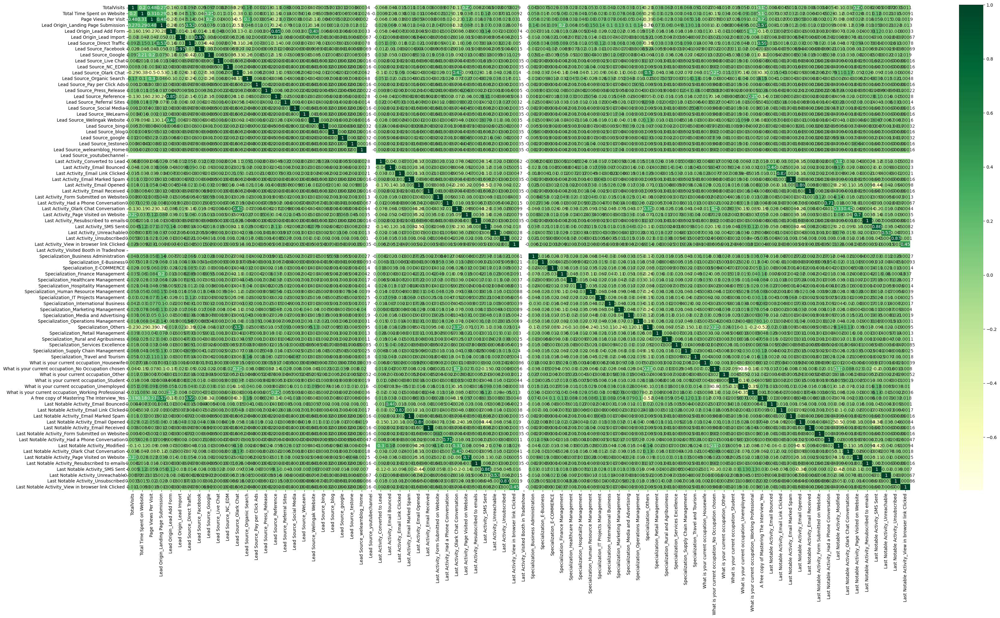

In [77]:
# Heat map to check the correlation of allthe variables in the data set
plt.figure(figsize = (40,20))
sns.heatmap(X_train.corr(), annot = True, cmap = "YlGn")
plt.show()

###### Observation: Since there are too many columns, data cannot be visualized properly. Cannot identify correlations between the variables.Correlation to be checked again after reducing the features

In [78]:
# Checking the correlation table
df_lead.corr()

,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,...,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked
Converted,1.000000,0.032855,0.359261,0.000260,-0.037481,0.300775,-0.009328,-0.073186,-0.010651,0.029960,...,-0.008194,0.044577,-0.263532,-0.071564,-0.033830,0.013451,0.360233,0.037893,-0.016286,-0.008194
TotalVisits,0.032855,1.000000,0.219723,0.511068,0.290347,-0.169742,-0.037808,0.095571,-0.036983,0.106848,...,-0.003146,0.022317,-0.107875,-0.037993,0.227450,-0.007468,-0.001620,0.005513,0.003061,0.009819
Total Time Spent on Website,0.359261,0.219723,1.000000,0.318350,0.292571,-0.188526,-0.050742,0.140793,-0.050248,0.215390,...,-0.003772,0.022925,-0.127020,-0.050877,0.028713,-0.009298,0.137169,0.009594,0.003951,-0.007584
Page Views Per Visit,0.000260,0.511068,0.318350,1.000000,0.484119,-0.268415,-0.056068,0.133118,-0.053735,0.204870,...,-0.001798,0.013928,-0.096466,-0.088593,0.026102,-0.011516,0.059445,0.019415,0.021668,0.001457
Lead Origin_Landing Page Submission,-0.037481,0.290347,0.292571,0.484119,1.000000,-0.282445,-0.062195,0.523695,-0.059438,0.078455,...,0.009722,0.002608,-0.084643,-0.118758,0.043041,-0.011337,0.052736,-0.000847,0.018171,-0.011337
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Last Notable Activity_Resubscribed to emails,0.013451,-0.007468,-0.009298,-0.011516,-0.011337,-0.002746,-0.000605,-0.006551,-0.000615,-0.007137,...,-0.000110,-0.000413,-0.007875,-0.001506,-0.002001,1.000000,-0.005854,-0.000625,-0.000741,-0.000110
Last Notable Activity_SMS Sent,0.360233,-0.001620,0.137169,0.059445,0.052736,0.115585,-0.027600,0.016095,-0.023765,-0.001771,...,-0.005854,-0.021918,-0.418219,-0.079994,-0.106259,-0.005854,1.000000,-0.033170,-0.039363,-0.005854
Last Notable Activity_Unreachable,0.037893,0.005513,0.009594,0.019415,-0.000847,0.007222,-0.003426,-0.016425,-0.003483,0.011539,...,-0.000625,-0.002339,-0.044621,-0.008535,-0.011337,-0.000625,-0.033170,1.000000,-0.004200,-0.000625
Last Notable Activity_Unsubscribed,-0.016286,0.003061,0.003951,0.021668,0.018171,-0.018465,-0.004066,0.004851,-0.004133,-0.000753,...,-0.000741,-0.002775,-0.052952,-0.010128,-0.013454,-0.000741,-0.039363,-0.004200,1.000000,-0.000741


###### Oservation:
We can see the correlation between the variables. In the coming steps we shall analyse with lesser variables as it will be easier to comprehend

## Building Logistic Regression Model

### Model 1

Building the first Logistic regression model with all the feature variables


In [79]:
# Adding constant
X_train_sm = sm.add_constant(X_train)

In [80]:
# Verifying the addition of constant
X_train_sm.head()

,const,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,...,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked
8204,1.0,0.000000,0.000000,0.000000,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
1027,1.0,0.007968,0.105571,0.036364,0,0,0,0,0,1,...,0,0,1,0,0,0,0,0,0,0
154,1.0,0.031873,0.569632,0.072727,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7610,1.0,0.023904,0.088949,0.109091,1,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0
5808,1.0,0.000000,0.000000,0.000000,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0


In [81]:
# Building the model
lgr = sm.GLM(y_train, X_train_sm, family = sm.families.Binomial())
lgr_model1 = lgr.fit()
lgr_model1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6351
Model:                            GLM   Df Residuals:                     6273
Model Family:                Binomial   Df Model:                           77
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2485.9
Date:                Tue, 15 Aug 2023   Deviance:                       4971.9
Time:                        18:55:35   Pearson chi2:                 6.26e+03
No. Iterations:                    24   Pseudo R-squ. (CS):             0.4203
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                   23.9041   2.16e+05      0.000      1.000   -4.23e+05    4.23e+05
TotalVisits                                              7.4483      2.333      3.192      0.001       2.875      12.021
Total Time Spent on Website                              4.5220      0.171     26.472      0.000       4.187       4.857
Page Views Per Visit                                    -4.9964      1.411     -3.540      0.000      -7.763      -2.230
Lead Origin_Landing Page Submission                     -0.8539      0.142     -6.009      0.000      -1.132      -0.575
Lead Origin_Lead Add Form                                0.5851      1.301      0.450      0.653      -1.964       3.134
Lead Origin_Lead Import                                 24.7930   2.16e+05      0.000      1.000   -4.23e+05    4.23e+05
Lead Source_Direct Traffic                              -0.2502      1.885     -0.133      0.894      -3.945       3.444
Lead Source_Facebook                                   -24.8551   2.16e+05     -0.000      1.000   -4.23e+05    4.23e+05
Lead Source_Google                                       0.0118      1.882      0.006      0.995      -3.676       3.700
Lead Source_Live Chat                                   25.5207   2.16e+05      0.000      1.000   -4.23e+05    4.23e+05
Lead Source_NC_EDM                                      26.4513   2.16e+05      0.000      1.000   -4.23e+05    4.23e+05
Lead Source_Olark Chat                                   1.0086      1.882      0.536      0.592      -2.680       4.697
Lead Source_Organic Search                              -0.0069      1.885     -0.004      0.997      -3.702       3.688
Lead Source_Pay per Click Ads                          -23.7480   2.16e+05     -0.000      1.000   -4.23e+05    4.23e+05
Lead Source_Press_Release                              -23.1761   1.51e+05     -0.000      1.000   -2.96e+05    2.96e+05
Lead Source_Reference                                    2.1955      1.379      1.592      0.111      -0.508       4.899
Lead Source_Referral Sites                              -0.3711      1.915     -0.194      0.846      -4.124       3.382
Lead Source_Social Media                               -22.7824   2.16e+05     -0.000      1.000   -4.23e+05    4.23e+05
Lead Source_WeLearn                                     24.9411   2.16e+05      0.000      1.000   -4.23e+05    4.23e+05
Lead Source_Welingak Website                            26.1813   2.03e+04      0.001      0.999   -3.98e+04    3.99e+04
Lead Source_bing                                         0.3506      2.281      0.154      0.878      -4.120       4.821
Lead Source_blog                                       -23

###### Observation:
There are too many variables. P values are very high for many variables.

###### We will use recursive feature elimination to reduce the number of features

#### RFE

Using recursive featrue elimination to reduce the number of features

In [82]:
# Initiating a logistic regression object
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

# running recursive feature elimination
rfe = RFE(estimator = logreg,n_features_to_select=25)             
rfe = rfe.fit(X_train, y_train)

# Display the variables and their ranking
list(zip(X_train.columns,rfe.support_,rfe.ranking_ ))

[('TotalVisits', True, 1),
 ('Total Time Spent on Website', True, 1),
 ('Page Views Per Visit', True, 1),
 ('Lead Origin_Landing Page Submission', True, 1),
 ('Lead Origin_Lead Add Form', True, 1),
 ('Lead Origin_Lead Import', False, 50),
 ('Lead Source_Direct Traffic', False, 10),
 ('Lead Source_Facebook', False, 11),
 ('Lead Source_Google', False, 13),
 ('Lead Source_Live Chat', False, 34),
 ('Lead Source_NC_EDM', True, 1),
 ('Lead Source_Olark Chat', True, 1),
 ('Lead Source_Organic Search', False, 12),
 ('Lead Source_Pay per Click Ads', False, 28),
 ('Lead Source_Press_Release', False, 21),
 ('Lead Source_Reference', True, 1),
 ('Lead Source_Referral Sites', False, 9),
 ('Lead Source_Social Media', False, 39),
 ('Lead Source_WeLearn', False, 22),
 ('Lead Source_Welingak Website', True, 1),
 ('Lead Source_bing', False, 49),
 ('Lead Source_blog', False, 26),
 ('Lead Source_google', False, 29),
 ('Lead Source_testone', False, 27),
 ('Lead Source_welearnblog_Home', False, 32),
 ('Lead 

In [83]:
# Checking the columns that is supported by RFE
X_train.columns[rfe.support_]

Index(['TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit',
       'Lead Origin_Landing Page Submission', 'Lead Origin_Lead Add Form',
       'Lead Source_NC_EDM', 'Lead Source_Olark Chat', 'Lead Source_Reference',
       'Lead Source_Welingak Website', 'Last Activity_Converted to Lead',
       'Last Activity_Email Bounced', 'Last Activity_Had a Phone Conversation',
       'Last Activity_Olark Chat Conversation',
       'Last Activity_Page Visited on Website',
       'Last Activity_Resubscribed to emails', 'Last Activity_Unsubscribed',
       'Specialization_Others', 'What is your current occupation_Housewife',
       'What is your current occupation_No Occupation chosen',
       'What is your current occupation_Working Professional',
       'Last Notable Activity_Email Link Clicked',
       'Last Notable Activity_Email Opened',
       'Last Notable Activity_Had a Phone Conversation',
       'Last Notable Activity_Modified',
       'Last Notable Activity_Olark Chat Con

In [84]:
# Making a list of the columns which are not supported by RFE
col = X_train.columns[~rfe.support_]
col

Index(['Lead Origin_Lead Import', 'Lead Source_Direct Traffic',
       'Lead Source_Facebook', 'Lead Source_Google', 'Lead Source_Live Chat',
       'Lead Source_Organic Search', 'Lead Source_Pay per Click Ads',
       'Lead Source_Press_Release', 'Lead Source_Referral Sites',
       'Lead Source_Social Media', 'Lead Source_WeLearn', 'Lead Source_bing',
       'Lead Source_blog', 'Lead Source_google', 'Lead Source_testone',
       'Lead Source_welearnblog_Home', 'Lead Source_youtubechannel',
       'Last Activity_Email Link Clicked', 'Last Activity_Email Marked Spam',
       'Last Activity_Email Opened', 'Last Activity_Email Received',
       'Last Activity_Form Submitted on Website', 'Last Activity_SMS Sent',
       'Last Activity_Unreachable',
       'Last Activity_View in browser link Clicked',
       'Last Activity_Visited Booth in Tradeshow',
       'Specialization_Business Administration', 'Specialization_E-Business',
       'Specialization_E-COMMERCE', 'Specialization_Finance Ma

In [85]:
# Dropping the columns which are not supported by RFE
X_train.drop(col, axis = 1, inplace = True)
X_train.columns

Index(['TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit',
       'Lead Origin_Landing Page Submission', 'Lead Origin_Lead Add Form',
       'Lead Source_NC_EDM', 'Lead Source_Olark Chat', 'Lead Source_Reference',
       'Lead Source_Welingak Website', 'Last Activity_Converted to Lead',
       'Last Activity_Email Bounced', 'Last Activity_Had a Phone Conversation',
       'Last Activity_Olark Chat Conversation',
       'Last Activity_Page Visited on Website',
       'Last Activity_Resubscribed to emails', 'Last Activity_Unsubscribed',
       'Specialization_Others', 'What is your current occupation_Housewife',
       'What is your current occupation_No Occupation chosen',
       'What is your current occupation_Working Professional',
       'Last Notable Activity_Email Link Clicked',
       'Last Notable Activity_Email Opened',
       'Last Notable Activity_Had a Phone Conversation',
       'Last Notable Activity_Modified',
       'Last Notable Activity_Olark Chat Con

In [86]:
# Checking the details of the data set after removing the columns
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6351 entries, 8204 to 4026
Data columns (total 25 columns):
 #   Column                                                Non-Null Count  Dtype  
---  ------                                                --------------  -----  
 0   TotalVisits                                           6351 non-null   float64
 1   Total Time Spent on Website                           6351 non-null   float64
 2   Page Views Per Visit                                  6351 non-null   float64
 3   Lead Origin_Landing Page Submission                   6351 non-null   uint8  
 4   Lead Origin_Lead Add Form                             6351 non-null   uint8  
 5   Lead Source_NC_EDM                                    6351 non-null   uint8  
 6   Lead Source_Olark Chat                                6351 non-null   uint8  
 7   Lead Source_Reference                                 6351 non-null   uint8  
 8   Lead Source_Welingak Website                          6

###### The columns recommended to be removed by RFE has been dropped and now the data frame has the above columns

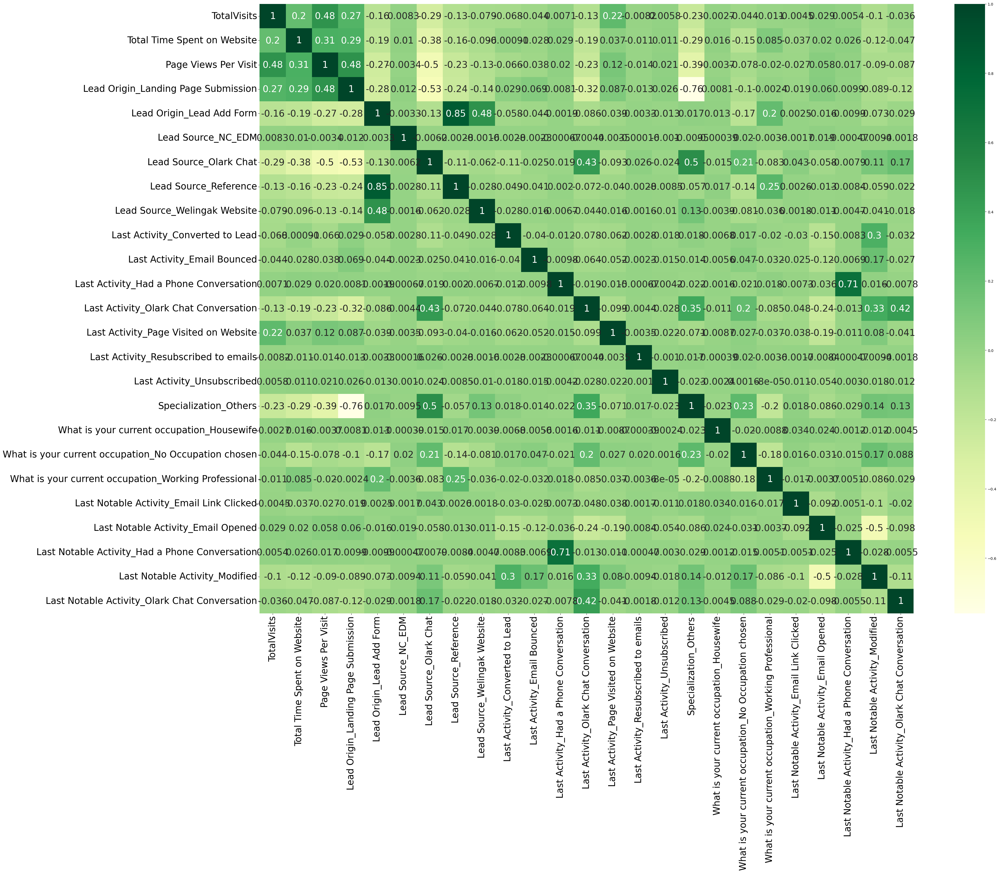

In [87]:
# Heat map to check the correlation of all the variables in the data set
plt.figure(figsize = (40,30))
sns.heatmap(X_train.corr(), annot = True,annot_kws={'size': 25}, cmap = "YlGn")
plt.xticks(fontsize = 25)
plt.yticks(fontsize = 25)
plt.show()

###### Observation: 
There are some highly correlated variables which can be seen in the heat map above.

###### Dropping highly correlated variables

In [88]:
# List of highly correlated columns
col = ['Lead Source_Reference','Lead Origin_Lead Add Form',
       'Last Notable Activity_Had a Phone Conversation','Lead Source_Olark Chat',
       'Specialization_Others','Lead Origin_Landing Page Submission',
       'Last Notable Activity_Olark Chat Conversation']

# Drop columns
X_train.drop(col, axis = 1, inplace = True)

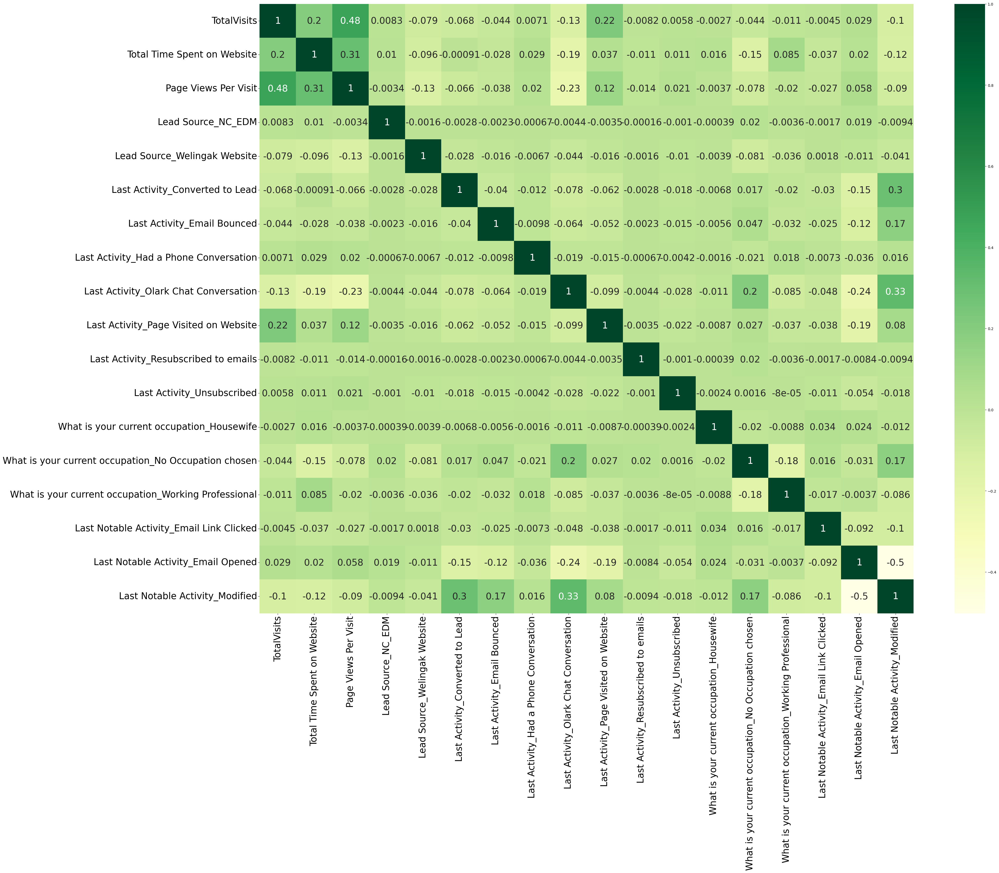

In [89]:
# Heat map to check the correlation of all the variables in the data set
plt.figure(figsize = (40,30))
sns.heatmap(X_train.corr(), annot = True,annot_kws={'size': 25}, cmap = "YlGn")
plt.xticks(fontsize = 25)
plt.yticks(fontsize = 25)
plt.show()

###### Observation:
Now, the variables present are not highly correlated with other variables.

In [90]:
# Check the shape of the train data set now
X_train.shape

(6351, 18)

### Model 2

After removal of columns seggested by RFE and columns deleted after correlation

In [91]:
# Adding constant to the training data set X_train 
X_train_sm2 = sm.add_constant(X_train)

In [92]:
X_train_sm2.head()

,const,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Source_NC_EDM,Lead Source_Welingak Website,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Had a Phone Conversation,Last Activity_Olark Chat Conversation,Last Activity_Page Visited on Website,Last Activity_Resubscribed to emails,Last Activity_Unsubscribed,What is your current occupation_Housewife,What is your current occupation_No Occupation chosen,What is your current occupation_Working Professional,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Opened,Last Notable Activity_Modified
8204,1.0,0.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1027,1.0,0.007968,0.105571,0.036364,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
154,1.0,0.031873,0.569632,0.072727,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
7610,1.0,0.023904,0.088949,0.109091,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5808,1.0,0.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


In [93]:
# Building the model
lgr = sm.GLM(y_train, X_train_sm2, family = sm.families.Binomial())
lgr_model2 = lgr.fit()
lgr_model2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6351
Model:                            GLM   Df Residuals:                     6332
Model Family:                Binomial   Df Model:                           18
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2713.4
Date:                Tue, 15 Aug 2023   Deviance:                       5426.8
Time:                        18:56:00   Pearson chi2:                 7.11e+03
No. Iterations:                    23   Pseudo R-squ. (CS):             0.3772
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                    0.3724      0.080      4.675      0.000       0.216       0.528
TotalVisits                                              4.3308      1.960      2.209      0.027       0.489       8.173
Total Time Spent on Website                              3.7846      0.151     25.051      0.000       3.489       4.081
Page Views Per Visit                                   -13.3857      1.177    -11.377      0.000     -15.692     -11.080
Lead Source_NC_EDM                                      25.3717   1.31e+05      0.000      1.000   -2.57e+05    2.57e+05
Lead Source_Welingak Website                            24.9408   1.25e+04      0.002      0.998   -2.44e+04    2.44e+04
Last Activity_Converted to Lead                         -1.7737      0.215     -8.265      0.000      -2.194      -1.353
Last Activity_Email Bounced                             -3.0775      0.360     -8.551      0.000      -3.783      -2.372
Last Activity_Had a Phone Conversation                   1.2494      0.630      1.982      0.048       0.014       2.485
Last Activity_Olark Chat Conversation                   -1.8701      0.167    -11.171      0.000      -2.198      -1.542
Last Activity_Page Visited on Website                   -1.6029      0.151    -10.598      0.000      -1.899      -1.306
Last Activity_Resubscribed to emails                    25.4697   1.31e+05      0.000      1.000   -2.57e+05    2.57e+05
Last Activity_Unsubscribed                              -1.8169      0.464     -3.914      0.000      -2.727      -0.907
What is your current occupation_Housewife               24.8977   4.85e+04      0.001      1.000    -9.5e+04    9.51e+04
What is your current occupation_No Occupation chosen    -1.2760      0.087    -14.701      0.000      -1.446      -1.106
What is your current occupation_Working Professional     2.8734      0.190     15.126      0.000       2.501       3.246
Last Notable Activity_Email Link Clicked                -1.8680      0.276     -6.779      0.000      -2.408      -1.328
Last Notable Activity_Email Opened                      -1.1798      0.083    -14.274      0.000      -1.342      -1.018
Last Notable Activity_Modified                          -1.1420      0.091    -12.540      0.000      -1.320      -0.963
========================================================================================================================
"""

###### Observation:
P value of the column "What is your current occupation_Housewife" is very high:



In [94]:
# Initiating vif as dataframe object
vif = pd.DataFrame()

# Reviewing the VIF values for the variables
vif["features"] = X_train.columns
vif["VIF"] = [variance_inflation_factor(X_train.values,i) for i in range(X_train.shape[1])]
vif["VIF"] = round(vif["VIF"],2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif)

                                             features   VIF
2                                Page Views Per Visit  2.76
17                     Last Notable Activity_Modified  2.19
0                                         TotalVisits  1.92
1                         Total Time Spent on Website  1.84
13  What is your current occupation_No Occupation ...  1.49
16                 Last Notable Activity_Email Opened  1.49
8               Last Activity_Olark Chat Conversation  1.44
5                     Last Activity_Converted to Lead  1.24
9               Last Activity_Page Visited on Website  1.22
6                         Last Activity_Email Bounced  1.11
14  What is your current occupation_Working Profes...  1.08
15           Last Notable Activity_Email Link Clicked  1.02
4                        Lead Source_Welingak Website  1.01
7              Last Activity_Had a Phone Conversation  1.01
11                         Last Activity_Unsubscribed  1.01
3                                  Lead 

###### Observation:
VIF values of all the features are within the range

### Model 3
After removing a variable with high p value and building the model again

In [95]:
# Removing the column with high p value
X_train.drop(['What is your current occupation_Housewife'],axis = 1, inplace = True)

In [96]:
X_train.head()

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Source_NC_EDM,Lead Source_Welingak Website,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Had a Phone Conversation,Last Activity_Olark Chat Conversation,Last Activity_Page Visited on Website,Last Activity_Resubscribed to emails,Last Activity_Unsubscribed,What is your current occupation_No Occupation chosen,What is your current occupation_Working Professional,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Opened,Last Notable Activity_Modified
8204,0.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1027,0.007968,0.105571,0.036364,0,0,0,0,0,0,0,0,0,0,0,0,0,1
154,0.031873,0.569632,0.072727,0,0,0,0,0,0,0,0,0,0,0,0,1,0
7610,0.023904,0.088949,0.109091,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5808,0.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0,1,0,0,0


In [97]:
# Adding constant to the training data set X_train 
X_train_sm3 = sm.add_constant(X_train)

In [98]:
X_train_sm3.head()

,const,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Source_NC_EDM,Lead Source_Welingak Website,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Had a Phone Conversation,Last Activity_Olark Chat Conversation,Last Activity_Page Visited on Website,Last Activity_Resubscribed to emails,Last Activity_Unsubscribed,What is your current occupation_No Occupation chosen,What is your current occupation_Working Professional,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Opened,Last Notable Activity_Modified
8204,1.0,0.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1027,1.0,0.007968,0.105571,0.036364,0,0,0,0,0,0,0,0,0,0,0,0,0,1
154,1.0,0.031873,0.569632,0.072727,0,0,0,0,0,0,0,0,0,0,0,0,1,0
7610,1.0,0.023904,0.088949,0.109091,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5808,1.0,0.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0,1,0,0,0


In [99]:
# Building the model
lgr = sm.GLM(y_train, X_train_sm3, family = sm.families.Binomial())
lgr_model3 = lgr.fit()
lgr_model3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6351
Model:                            GLM   Df Residuals:                     6333
Model Family:                Binomial   Df Model:                           17
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2718.4
Date:                Tue, 15 Aug 2023   Deviance:                       5436.9
Time:                        18:56:00   Pearson chi2:                 7.13e+03
No. Iterations:                    23   Pseudo R-squ. (CS):             0.3762
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                    0.3751      0.080      4.710      0.000       0.219       0.531
TotalVisits                                              4.3128      1.959      2.202      0.028       0.474       8.152
Total Time Spent on Website                              3.7863      0.151     25.077      0.000       3.490       4.082
Page Views Per Visit                                   -13.4199      1.176    -11.411      0.000     -15.725     -11.115
Lead Source_NC_EDM                                      25.3696   1.31e+05      0.000      1.000   -2.57e+05    2.57e+05
Lead Source_Welingak Website                            24.9335   1.25e+04      0.002      0.998   -2.44e+04    2.45e+04
Last Activity_Converted to Lead                         -1.7775      0.215     -8.284      0.000      -2.198      -1.357
Last Activity_Email Bounced                             -3.0796      0.360     -8.559      0.000      -3.785      -2.374
Last Activity_Had a Phone Conversation                   1.2480      0.631      1.979      0.048       0.012       2.484
Last Activity_Olark Chat Conversation                   -1.8727      0.167    -11.187      0.000      -2.201      -1.545
Last Activity_Page Visited on Website                   -1.6038      0.151    -10.605      0.000      -1.900      -1.307
Last Activity_Resubscribed to emails                    25.4716   1.31e+05      0.000      1.000   -2.57e+05    2.57e+05
Last Activity_Unsubscribed                              -1.8173      0.464     -3.914      0.000      -2.727      -0.907
What is your current occupation_No Occupation chosen    -1.2806      0.087    -14.760      0.000      -1.451      -1.111
What is your current occupation_Working Professional     2.8686      0.190     15.102      0.000       2.496       3.241
Last Notable Activity_Email Link Clicked                -1.8110      0.271     -6.683      0.000      -2.342      -1.280
Last Notable Activity_Email Opened                      -1.1748      0.083    -14.224      0.000      -1.337      -1.013
Last Notable Activity_Modified                          -1.1391      0.091    -12.514      0.000      -1.318      -0.961
========================================================================================================================
"""

###### Observation:¶
Few columns have high p values

'Last Activity_Resubscribed to emails' has high p value

In [100]:
# Initiating vif as dataframe object
vif = pd.DataFrame()

# Reviewing the VIF values for the variables
vif["features"] = X_train.columns
vif["VIF"] = [variance_inflation_factor(X_train.values,i) for i in range(X_train.shape[1])]
vif["VIF"] = round(vif["VIF"],2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif)

                                             features   VIF
2                                Page Views Per Visit  2.76
16                     Last Notable Activity_Modified  2.19
0                                         TotalVisits  1.92
1                         Total Time Spent on Website  1.84
12  What is your current occupation_No Occupation ...  1.49
15                 Last Notable Activity_Email Opened  1.49
8               Last Activity_Olark Chat Conversation  1.44
5                     Last Activity_Converted to Lead  1.24
9               Last Activity_Page Visited on Website  1.22
6                         Last Activity_Email Bounced  1.11
13  What is your current occupation_Working Profes...  1.08
14           Last Notable Activity_Email Link Clicked  1.02
4                        Lead Source_Welingak Website  1.01
7              Last Activity_Had a Phone Conversation  1.01
11                         Last Activity_Unsubscribed  1.01
3                                  Lead 

###### Observation: 
VIF of all the features are within the accepted range

### Model 4
After removal of 'What is your current occupation_Housewife'column

In [101]:
# Dropping the column
X_train.drop(['Last Activity_Resubscribed to emails'],axis = 1, inplace = True)
X_train.head()

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Source_NC_EDM,Lead Source_Welingak Website,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Had a Phone Conversation,Last Activity_Olark Chat Conversation,Last Activity_Page Visited on Website,Last Activity_Unsubscribed,What is your current occupation_No Occupation chosen,What is your current occupation_Working Professional,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Opened,Last Notable Activity_Modified
8204,0.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0,0,0,0
1027,0.007968,0.105571,0.036364,0,0,0,0,0,0,0,0,0,0,0,0,1
154,0.031873,0.569632,0.072727,0,0,0,0,0,0,0,0,0,0,0,1,0
7610,0.023904,0.088949,0.109091,0,0,0,0,0,0,0,0,0,0,0,0,0
5808,0.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,1,0,0,0


In [102]:
# Adding constant to the training data set X_train 
X_train_sm4 = sm.add_constant(X_train)
X_train_sm4.head()

,const,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Source_NC_EDM,Lead Source_Welingak Website,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Had a Phone Conversation,Last Activity_Olark Chat Conversation,Last Activity_Page Visited on Website,Last Activity_Unsubscribed,What is your current occupation_No Occupation chosen,What is your current occupation_Working Professional,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Opened,Last Notable Activity_Modified
8204,1.0,0.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0,0,0,0
1027,1.0,0.007968,0.105571,0.036364,0,0,0,0,0,0,0,0,0,0,0,0,1
154,1.0,0.031873,0.569632,0.072727,0,0,0,0,0,0,0,0,0,0,0,1,0
7610,1.0,0.023904,0.088949,0.109091,0,0,0,0,0,0,0,0,0,0,0,0,0
5808,1.0,0.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,1,0,0,0


In [103]:
# Building the model
lgr = sm.GLM(y_train, X_train_sm4, family = sm.families.Binomial())
lgr_model4 = lgr.fit()
lgr_model4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6351
Model:                            GLM   Df Residuals:                     6334
Model Family:                Binomial   Df Model:                           16
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2719.7
Date:                Tue, 15 Aug 2023   Deviance:                       5439.4
Time:                        18:56:01   Pearson chi2:                 7.14e+03
No. Iterations:                    23   Pseudo R-squ. (CS):             0.3760
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                    0.3786      0.080      4.756      0.000       0.223       0.535
TotalVisits                                              4.3055      1.958      2.199      0.028       0.468       8.143
Total Time Spent on Website                              3.7843      0.151     25.068      0.000       3.488       4.080
Page Views Per Visit                                   -13.4436      1.176    -11.432      0.000     -15.749     -11.139
Lead Source_NC_EDM                                      25.3662   1.31e+05      0.000      1.000   -2.57e+05    2.57e+05
Lead Source_Welingak Website                            24.9318   1.25e+04      0.002      0.998   -2.44e+04    2.45e+04
Last Activity_Converted to Lead                         -1.7776      0.215     -8.286      0.000      -2.198      -1.357
Last Activity_Email Bounced                             -3.0808      0.360     -8.562      0.000      -3.786      -2.376
Last Activity_Had a Phone Conversation                   1.2472      0.631      1.978      0.048       0.011       2.483
Last Activity_Olark Chat Conversation                   -1.8747      0.167    -11.201      0.000      -2.203      -1.547
Last Activity_Page Visited on Website                   -1.6051      0.151    -10.615      0.000      -1.901      -1.309
Last Activity_Unsubscribed                              -1.8194      0.464     -3.920      0.000      -2.729      -0.910
What is your current occupation_No Occupation chosen    -1.2763      0.087    -14.730      0.000      -1.446      -1.106
What is your current occupation_Working Professional     2.8687      0.190     15.101      0.000       2.496       3.241
Last Notable Activity_Email Link Clicked                -1.8139      0.271     -6.695      0.000      -2.345      -1.283
Last Notable Activity_Email Opened                      -1.1775      0.083    -14.260      0.000      -1.339      -1.016
Last Notable Activity_Modified                          -1.1417      0.091    -12.546      0.000      -1.320      -0.963
========================================================================================================================
"""

###### Observation:
P values of the column "Lead Source_Welingak Website" is very high

In [104]:
# Initiating vif as dataframe object
vif = pd.DataFrame()

# Reviewing the VIF values for the variables
vif["features"] = X_train.columns
vif["VIF"] = [variance_inflation_factor(X_train.values,i) for i in range(X_train.shape[1])]
vif["VIF"] = round(vif["VIF"],2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif)

                                             features   VIF
2                                Page Views Per Visit  2.76
15                     Last Notable Activity_Modified  2.19
0                                         TotalVisits  1.92
1                         Total Time Spent on Website  1.84
11  What is your current occupation_No Occupation ...  1.49
14                 Last Notable Activity_Email Opened  1.49
8               Last Activity_Olark Chat Conversation  1.44
5                     Last Activity_Converted to Lead  1.24
9               Last Activity_Page Visited on Website  1.22
6                         Last Activity_Email Bounced  1.11
12  What is your current occupation_Working Profes...  1.08
13           Last Notable Activity_Email Link Clicked  1.02
4                        Lead Source_Welingak Website  1.01
7              Last Activity_Had a Phone Conversation  1.01
10                         Last Activity_Unsubscribed  1.01
3                                  Lead 

###### Observation: 
All the VIF values are within the range

### Model 5
After removing TotalVisits

In [105]:
# Dropping the column
X_train.drop(["Lead Source_Welingak Website"],axis = 1, inplace = True)
X_train.head()

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Source_NC_EDM,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Had a Phone Conversation,Last Activity_Olark Chat Conversation,Last Activity_Page Visited on Website,Last Activity_Unsubscribed,What is your current occupation_No Occupation chosen,What is your current occupation_Working Professional,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Opened,Last Notable Activity_Modified
8204,0.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0,0,0
1027,0.007968,0.105571,0.036364,0,0,0,0,0,0,0,0,0,0,0,1
154,0.031873,0.569632,0.072727,0,0,0,0,0,0,0,0,0,0,1,0
7610,0.023904,0.088949,0.109091,0,0,0,0,0,0,0,0,0,0,0,0
5808,0.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,1,0,0,0


In [106]:
# Adding constant to the training data set X_train 
X_train_sm5 = sm.add_constant(X_train)
X_train_sm5.head()

,const,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Source_NC_EDM,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Had a Phone Conversation,Last Activity_Olark Chat Conversation,Last Activity_Page Visited on Website,Last Activity_Unsubscribed,What is your current occupation_No Occupation chosen,What is your current occupation_Working Professional,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Opened,Last Notable Activity_Modified
8204,1.0,0.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0,0,0
1027,1.0,0.007968,0.105571,0.036364,0,0,0,0,0,0,0,0,0,0,0,1
154,1.0,0.031873,0.569632,0.072727,0,0,0,0,0,0,0,0,0,0,1,0
7610,1.0,0.023904,0.088949,0.109091,0,0,0,0,0,0,0,0,0,0,0,0
5808,1.0,0.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,1,0,0,0


In [107]:
# Building the model
lgr = sm.GLM(y_train, X_train_sm5, family = sm.families.Binomial())
lgr_model5 = lgr.fit()
lgr_model5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6351
Model:                            GLM   Df Residuals:                     6335
Model Family:                Binomial   Df Model:                           15
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2800.0
Date:                Tue, 15 Aug 2023   Deviance:                       5599.9
Time:                        18:56:01   Pearson chi2:                 8.10e+03
No. Iterations:                    19   Pseudo R-squ. (CS):             0.3600
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                    0.5738      0.077      7.424      0.000       0.422       0.725
TotalVisits                                              3.8981      1.949      2.000      0.045       0.079       7.717
Total Time Spent on Website                              3.6794      0.151     24.424      0.000       3.384       3.975
Page Views Per Visit                                   -15.2140      1.174    -12.956      0.000     -17.516     -12.912
Lead Source_NC_EDM                                      21.3762   1.77e+04      0.001      0.999   -3.47e+04    3.48e+04
Last Activity_Converted to Lead                         -1.8600      0.213     -8.736      0.000      -2.277      -1.443
Last Activity_Email Bounced                             -3.0450      0.345     -8.818      0.000      -3.722      -2.368
Last Activity_Had a Phone Conversation                   1.2062      0.633      1.907      0.057      -0.034       2.446
Last Activity_Olark Chat Conversation                   -1.9843      0.166    -11.941      0.000      -2.310      -1.659
Last Activity_Page Visited on Website                   -1.6044      0.149    -10.798      0.000      -1.896      -1.313
Last Activity_Unsubscribed                              -1.8651      0.462     -4.036      0.000      -2.771      -0.959
What is your current occupation_No Occupation chosen    -1.3531      0.086    -15.719      0.000      -1.522      -1.184
What is your current occupation_Working Professional     2.7897      0.190     14.665      0.000       2.417       3.163
Last Notable Activity_Email Link Clicked                -1.7965      0.261     -6.879      0.000      -2.308      -1.285
Last Notable Activity_Email Opened                      -1.1944      0.081    -14.683      0.000      -1.354      -1.035
Last Notable Activity_Modified                          -1.1422      0.089    -12.777      0.000      -1.317      -0.967
========================================================================================================================
"""

###### Observation:
P values of the following columns are very high:
Lead Source_NC_EDM,
Last Activity_Had a Phone Conversation

In [108]:
# Initiating vif as dataframe object
vif = pd.DataFrame()

# Reviewing the VIF values for the variables
vif["features"] = X_train.columns
vif["VIF"] = [variance_inflation_factor(X_train.values,i) for i in range(X_train.shape[1])]
vif["VIF"] = round(vif["VIF"],2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif)    

                                             features   VIF
2                                Page Views Per Visit  2.76
14                     Last Notable Activity_Modified  2.18
0                                         TotalVisits  1.92
1                         Total Time Spent on Website  1.84
10  What is your current occupation_No Occupation ...  1.49
13                 Last Notable Activity_Email Opened  1.48
7               Last Activity_Olark Chat Conversation  1.44
4                     Last Activity_Converted to Lead  1.24
8               Last Activity_Page Visited on Website  1.22
5                         Last Activity_Email Bounced  1.11
11  What is your current occupation_Working Profes...  1.08
12           Last Notable Activity_Email Link Clicked  1.02
6              Last Activity_Had a Phone Conversation  1.01
9                          Last Activity_Unsubscribed  1.01
3                                  Lead Source_NC_EDM  1.00


###### Observation: VIF values are in the acceptable range

#### Prediction after building Model 5 to check the metrics

In [109]:
# Getting the predicted values on the train set
y_train_pred = lgr_model5.predict(X_train_sm5)
y_train_pred.head()

8204    0.639649
1027    0.331354
154     0.620837
7610    0.339525
5808    0.966545
dtype: float64

In [110]:
# Reshaping to make y_train_pred an array
y_train_pred = y_train_pred.values.reshape(-1)

# List out first 10 values of the array
y_train_pred[:10]

array([0.6396492 , 0.33135363, 0.62083686, 0.33952511, 0.96654519,
       0.62872153, 0.24045892, 0.68573574, 0.96654519, 0.89744216])

In [111]:
# Create a dataframe to see the probability of conversion of a lead and actually converted leads
y_train_pred_final = pd.DataFrame({'Converted':y_train.values, 'Converted_Prob':y_train_pred})
y_train_pred_final['Index'] = y_train.index
y_train_pred_final.head()

,Converted,Converted_Prob,Index
0,0,0.639649,8204
1,1,0.331354,1027
2,1,0.620837,154
3,0,0.339525,7610
4,1,0.966545,5808


In [112]:
# Mapping the Predicted values as Converted if the probability is more than 0.5
y_train_pred_final['Predicted'] = y_train_pred_final["Converted_Prob"].map(lambda x: 1 if x > 0.5 else 0)

# Let's see the head
y_train_pred_final.head()

,Converted,Converted_Prob,Index,Predicted
0,0,0.639649,8204,1
1,1,0.331354,1027,0
2,1,0.620837,154,1
3,0,0.339525,7610,0
4,1,0.966545,5808,1


In [113]:
# Confusion matrix 
confusion = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.Predicted )
print(confusion)

[[3404  534]
 [ 810 1603]]


In [114]:
# Checking the accuracy.
print(metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.Predicted))

0.788379782711384


In [115]:
# Assigning True positives, True Negatives, False Positives, False Negatives
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [116]:
# Calculation of sensitivity of our logistic regression model
TP / float(TP+FN)

0.6643182760049731

In [117]:
# Calculation of specificity
TN / float(TN+FP)

0.8643981716607415

### Model 6

In [118]:
# Dropping the column
X_train.drop(["Lead Source_NC_EDM"],axis = 1, inplace = True)
X_train.head()

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Had a Phone Conversation,Last Activity_Olark Chat Conversation,Last Activity_Page Visited on Website,Last Activity_Unsubscribed,What is your current occupation_No Occupation chosen,What is your current occupation_Working Professional,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Opened,Last Notable Activity_Modified
8204,0.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0,0
1027,0.007968,0.105571,0.036364,0,0,0,0,0,0,0,0,0,0,1
154,0.031873,0.569632,0.072727,0,0,0,0,0,0,0,0,0,1,0
7610,0.023904,0.088949,0.109091,0,0,0,0,0,0,0,0,0,0,0
5808,0.000000,0.000000,0.000000,0,0,0,0,0,0,0,1,0,0,0


In [119]:
# Adding constant to the training data set X_train 
X_train_sm6 = sm.add_constant(X_train)
X_train_sm6.head()

,const,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Had a Phone Conversation,Last Activity_Olark Chat Conversation,Last Activity_Page Visited on Website,Last Activity_Unsubscribed,What is your current occupation_No Occupation chosen,What is your current occupation_Working Professional,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Opened,Last Notable Activity_Modified
8204,1.0,0.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0,0
1027,1.0,0.007968,0.105571,0.036364,0,0,0,0,0,0,0,0,0,0,1
154,1.0,0.031873,0.569632,0.072727,0,0,0,0,0,0,0,0,0,1,0
7610,1.0,0.023904,0.088949,0.109091,0,0,0,0,0,0,0,0,0,0,0
5808,1.0,0.000000,0.000000,0.000000,0,0,0,0,0,0,0,1,0,0,0


In [120]:
# Building the model
lgr = sm.GLM(y_train, X_train_sm6, family = sm.families.Binomial())
lgr_model6 = lgr.fit()
lgr_model6.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6351
Model:                            GLM   Df Residuals:                     6336
Model Family:                Binomial   Df Model:                           14
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2801.1
Date:                Tue, 15 Aug 2023   Deviance:                       5602.3
Time:                        18:56:02   Pearson chi2:                 8.10e+03
No. Iterations:                     6   Pseudo R-squ. (CS):             0.3598
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                    0.5731      0.077      7.416      0.000       0.422       0.725
TotalVisits                                              3.9383      1.953      2.016      0.044       0.110       7.767
Total Time Spent on Website                              3.6820      0.151     24.441      0.000       3.387       3.977
Page Views Per Visit                                   -15.2370      1.175    -12.968      0.000     -17.540     -12.934
Last Activity_Converted to Lead                         -1.8601      0.213     -8.737      0.000      -2.277      -1.443
Last Activity_Email Bounced                             -3.0452      0.345     -8.819      0.000      -3.722      -2.368
Last Activity_Had a Phone Conversation                   1.2064      0.633      1.907      0.056      -0.033       2.446
Last Activity_Olark Chat Conversation                   -1.9849      0.166    -11.945      0.000      -2.311      -1.659
Last Activity_Page Visited on Website                   -1.6054      0.149    -10.803      0.000      -1.897      -1.314
Last Activity_Unsubscribed                              -1.8655      0.462     -4.037      0.000      -2.771      -0.960
What is your current occupation_No Occupation chosen    -1.3491      0.086    -15.692      0.000      -1.518      -1.181
What is your current occupation_Working Professional     2.7900      0.190     14.665      0.000       2.417       3.163
Last Notable Activity_Email Link Clicked                -1.7968      0.261     -6.881      0.000      -2.309      -1.285
Last Notable Activity_Email Opened                      -1.1925      0.081    -14.663      0.000      -1.352      -1.033
Last Notable Activity_Modified                          -1.1424      0.089    -12.781      0.000      -1.318      -0.967
========================================================================================================================
"""

###### Observation : 
"Last Activity_Had a Phone Conversation" has slightly high p value

In [121]:
# Initiating vif as dataframe object
vif = pd.DataFrame()

# Reviewing the VIF values for the variables
vif["features"] = X_train.columns
vif["VIF"] = [variance_inflation_factor(X_train.values,i) for i in range(X_train.shape[1])]
vif["VIF"] = round(vif["VIF"],2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif)   

                                             features   VIF
2                                Page Views Per Visit  2.76
13                     Last Notable Activity_Modified  2.18
0                                         TotalVisits  1.92
1                         Total Time Spent on Website  1.84
9   What is your current occupation_No Occupation ...  1.49
12                 Last Notable Activity_Email Opened  1.48
6               Last Activity_Olark Chat Conversation  1.44
3                     Last Activity_Converted to Lead  1.24
7               Last Activity_Page Visited on Website  1.22
4                         Last Activity_Email Bounced  1.11
10  What is your current occupation_Working Profes...  1.08
11           Last Notable Activity_Email Link Clicked  1.02
5              Last Activity_Had a Phone Conversation  1.01
8                          Last Activity_Unsubscribed  1.01


## Model 7

In [122]:
# Dropping the column
X_train.drop(["Last Activity_Had a Phone Conversation"],axis = 1, inplace = True)
X_train.head()

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Olark Chat Conversation,Last Activity_Page Visited on Website,Last Activity_Unsubscribed,What is your current occupation_No Occupation chosen,What is your current occupation_Working Professional,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Opened,Last Notable Activity_Modified
8204,0.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0
1027,0.007968,0.105571,0.036364,0,0,0,0,0,0,0,0,0,1
154,0.031873,0.569632,0.072727,0,0,0,0,0,0,0,0,1,0
7610,0.023904,0.088949,0.109091,0,0,0,0,0,0,0,0,0,0
5808,0.000000,0.000000,0.000000,0,0,0,0,0,0,1,0,0,0


In [123]:
# Adding constant to the training data set X_train 
X_train_sm7 = sm.add_constant(X_train)
X_train_sm7.head()

,const,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Olark Chat Conversation,Last Activity_Page Visited on Website,Last Activity_Unsubscribed,What is your current occupation_No Occupation chosen,What is your current occupation_Working Professional,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Opened,Last Notable Activity_Modified
8204,1.0,0.000000,0.000000,0.000000,0,0,0,0,0,0,0,0,0,0
1027,1.0,0.007968,0.105571,0.036364,0,0,0,0,0,0,0,0,0,1
154,1.0,0.031873,0.569632,0.072727,0,0,0,0,0,0,0,0,1,0
7610,1.0,0.023904,0.088949,0.109091,0,0,0,0,0,0,0,0,0,0
5808,1.0,0.000000,0.000000,0.000000,0,0,0,0,0,0,1,0,0,0


In [124]:
# Building the model
lgr = sm.GLM(y_train, X_train_sm7, family = sm.families.Binomial())
lgr_model7 = lgr.fit()
lgr_model7.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6351
Model:                            GLM   Df Residuals:                     6337
Model Family:                Binomial   Df Model:                           13
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2803.1
Date:                Tue, 15 Aug 2023   Deviance:                       5606.2
Time:                        18:56:02   Pearson chi2:                 8.07e+03
No. Iterations:                     6   Pseudo R-squ. (CS):             0.3594
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                    0.5770      0.077      7.468      0.000       0.426       0.728
TotalVisits                                              3.9472      1.953      2.021      0.043       0.119       7.776
Total Time Spent on Website                              3.6797      0.151     24.439      0.000       3.385       3.975
Page Views Per Visit                                   -15.1810      1.174    -12.935      0.000     -17.481     -12.881
Last Activity_Converted to Lead                         -1.8700      0.213     -8.788      0.000      -2.287      -1.453
Last Activity_Email Bounced                             -3.0527      0.345     -8.844      0.000      -3.729      -2.376
Last Activity_Olark Chat Conversation                   -1.9928      0.166    -11.999      0.000      -2.318      -1.667
Last Activity_Page Visited on Website                   -1.6133      0.149    -10.862      0.000      -1.904      -1.322
Last Activity_Unsubscribed                              -1.8722      0.462     -4.052      0.000      -2.778      -0.967
What is your current occupation_No Occupation chosen    -1.3499      0.086    -15.707      0.000      -1.518      -1.181
What is your current occupation_Working Professional     2.7884      0.190     14.661      0.000       2.416       3.161
Last Notable Activity_Email Link Clicked                -1.8020      0.261     -6.901      0.000      -2.314      -1.290
Last Notable Activity_Email Opened                      -1.1982      0.081    -14.742      0.000      -1.357      -1.039
Last Notable Activity_Modified                          -1.1370      0.089    -12.739      0.000      -1.312      -0.962
========================================================================================================================
"""

In [125]:
# Initiating vif as dataframe object
vif = pd.DataFrame()

# Reviewing the VIF values for the variables
vif["features"] = X_train.columns
vif["VIF"] = [variance_inflation_factor(X_train.values,i) for i in range(X_train.shape[1])]
vif["VIF"] = round(vif["VIF"],2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif)   

                                             features   VIF
2                                Page Views Per Visit  2.76
12                     Last Notable Activity_Modified  2.18
0                                         TotalVisits  1.92
1                         Total Time Spent on Website  1.84
8   What is your current occupation_No Occupation ...  1.49
11                 Last Notable Activity_Email Opened  1.48
5               Last Activity_Olark Chat Conversation  1.44
3                     Last Activity_Converted to Lead  1.24
6               Last Activity_Page Visited on Website  1.22
4                         Last Activity_Email Bounced  1.11
9   What is your current occupation_Working Profes...  1.08
10           Last Notable Activity_Email Link Clicked  1.02
7                          Last Activity_Unsubscribed  1.01


### Prediction on the train set

In [126]:
# Getting the predicted values on the train set
y_train_pred = lgr_model7.predict(X_train_sm7)
y_train_pred.head()

8204    0.640379
1027    0.333557
154     0.621670
7610    0.341316
5808    0.966605
dtype: float64

In [127]:
# Reshaping to make y_train_pred an array
y_train_pred = y_train_pred.values.reshape(-1)

In [128]:
# List out first 10 values of the array
y_train_pred[:10]

array([0.64037946, 0.33355721, 0.62167004, 0.34131621, 0.96660464,
       0.63060625, 0.2408036 , 0.68685781, 0.96660464, 0.89726432])

In [129]:
# Create a dataframe to see the probability of conversion of a lead and actually converted leads
y_train_pred_final = pd.DataFrame({'Converted':y_train.values, 'Converted_Prob':y_train_pred})
y_train_pred_final['Index'] = y_train.index
y_train_pred_final.head()

,Converted,Converted_Prob,Index
0,0,0.640379,8204
1,1,0.333557,1027
2,1,0.621670,154
3,0,0.341316,7610
4,1,0.966605,5808


In [130]:
# Mapping the Predicted values as Converted if the probability is more than 0.5
y_train_pred_final['Predicted'] = y_train_pred_final["Converted_Prob"].map(lambda x: 1 if x > 0.5 else 0)

# Let's see the head
y_train_pred_final.head()

,Converted,Converted_Prob,Index,Predicted
0,0,0.640379,8204,1
1,1,0.333557,1027,0
2,1,0.621670,154,1
3,0,0.341316,7610,0
4,1,0.966605,5808,1


In [131]:
# Confusion matrix 
confusion = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.Predicted )
print(confusion)

[[3407  531]
 [ 811 1602]]


In [132]:
# Checking the accuracy.
print(metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.Predicted))

0.7886946937490159


### Calculation of other metrics

In [133]:
# Assigning True positives, True Negatives, False Positives, False Negatives
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [134]:
# Calculation of sensitivity of our logistic regression model
TP / float(TP+FN)

0.6639038541234977

In [135]:
# Calculation of specificity
TN / float(TN+FP)

0.8651599796851194

In [136]:
# Calculating false postive rate - predicting Converted when the lead had not converted
print(FP/ float(TN+FP))

0.13484002031488065


In [137]:
# Negative predictive value
print (TN / float(TN+ FN))

0.807728781412992


## Plotting ROC Curve

In [138]:
# Function to plot the ROC curve
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs, drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [139]:
# Calculating the metrics to plot the ROC curve
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final.Converted, y_train_pred_final.Converted_Prob, drop_intermediate = False )

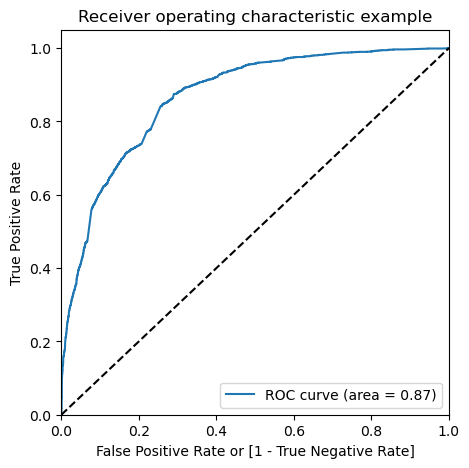

In [140]:
# Plotting the ROC curve
draw_roc(y_train_pred_final.Converted, y_train_pred_final.Converted_Prob)

## Finding Optimal Cut off point

In [141]:
# Creating columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Converted_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,Converted,Converted_Prob,Index,Predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.640379,8204,1,1,1,1,1,1,1,1,0,0,0
1,1,0.333557,1027,0,1,1,1,1,0,0,0,0,0,0
2,1,0.621670,154,1,1,1,1,1,1,1,1,0,0,0
3,0,0.341316,7610,0,1,1,1,1,0,0,0,0,0,0
4,1,0.966605,5808,1,1,1,1,1,1,1,1,1,1,1


In [142]:
# Calculating accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])

# List of various probabilities
num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.379940  1.000000  0.000000
0.1   0.1  0.610298  0.975549  0.386491
0.2   0.2  0.707763  0.937422  0.567039
0.3   0.3  0.763974  0.884376  0.690198
0.4   0.4  0.784128  0.722752  0.821737
0.5   0.5  0.788695  0.663904  0.865160
0.6   0.6  0.787435  0.593038  0.906552
0.7   0.7  0.747284  0.418981  0.948451
0.8   0.8  0.723193  0.315789  0.972829
0.9   0.9  0.687608  0.193535  0.990350


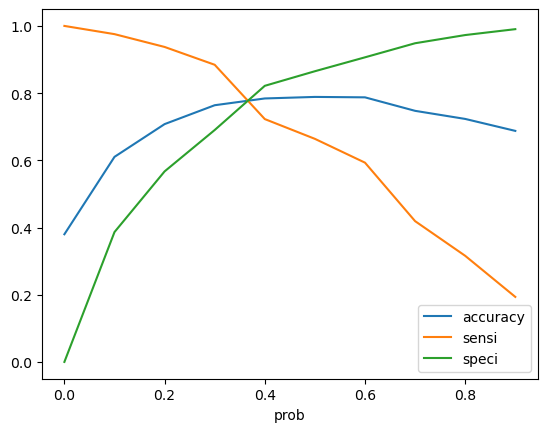

In [143]:
# Plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

###### Observation:
The optimal cut off point is 0.34

In [144]:
# Prediction using the optimal cut off point
y_train_pred_final['final_predicted'] = y_train_pred_final.Converted_Prob.map( lambda x: 1 if x > 0.34 else 0)

y_train_pred_final.head()

,Converted,Converted_Prob,Index,Predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,0,0.640379,8204,1,1,1,1,1,1,1,1,0,0,0,1
1,1,0.333557,1027,0,1,1,1,1,0,0,0,0,0,0,0
2,1,0.621670,154,1,1,1,1,1,1,1,1,0,0,0,1
3,0,0.341316,7610,0,1,1,1,1,0,0,0,0,0,0,1
4,1,0.966605,5808,1,1,1,1,1,1,1,1,1,1,1,1


In [145]:
# Check the overall accuracy.
metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.final_predicted)

0.7784600850259802

In [146]:
# Confusion matrix with the optimal cut off point
confusion2 = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.final_predicted )
confusion2

array([[2897, 1041],
       [ 366, 2047]], dtype=int64)

In [147]:
# Assigning values from confusion matrix

TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [148]:
# Sensitivity of the logistic regression model at the optimal cut off point
TP / float(TP+FN)

0.8483215913800248

###### Observation:
The sensitivity has increased by choosing the optimal cut off point.

In [149]:
# Calculate specificity of the logistic regression model at the optimal cut off point
TN / float(TN+FP)

0.7356526155408837

In [150]:
# Calculate false postive rate - predicting Converted when customer has not Converted
print(FP/ float(TN+FP))

0.2643473844591163


In [151]:
# Positive predictive value 
print (TP / float(TP+FP))

0.6628886010362695


In [152]:
# Negative predictive value
print (TN / float(TN+ FN))

0.887833282255593


## Precision and Recall

In [153]:
# Consusion matrix 
confusion = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.Predicted )
confusion

array([[3407,  531],
       [ 811, 1602]], dtype=int64)

###### Precision
TP / TP + FP

In [154]:
# Calculating precision
confusion[1,1]/(confusion[0,1]+confusion[1,1])

0.7510548523206751

###### Recall
TP / TP + FN

In [155]:
# Calculating recall
confusion[1,1]/(confusion[1,0]+confusion[1,1])

0.6639038541234977

In [156]:
# Precision using the library function
precision_score(y_train_pred_final.Converted, y_train_pred_final.Predicted)

0.7510548523206751

In [157]:
# Recall using the library function
recall_score(y_train_pred_final.Converted, y_train_pred_final.Predicted)

0.6639038541234977

### Precision and recall tradeoff

In [158]:
# Display Converted and Predicted values of train data
print(y_train_pred_final.Converted,"\n", y_train_pred_final.Predicted)

0       0
1       1
2       1
3       0
4       1
       ..
6346    0
6347    0
6348    0
6349    0
6350    1
Name: Converted, Length: 6351, dtype: int64 
 0       1
1       0
2       1
3       0
4       1
       ..
6346    1
6347    0
6348    0
6349    0
6350    1
Name: Predicted, Length: 6351, dtype: int64


In [159]:
# Precision Recall Curve
p, r, thresholds = precision_recall_curve(y_train_pred_final.Converted, y_train_pred_final.Converted_Prob)

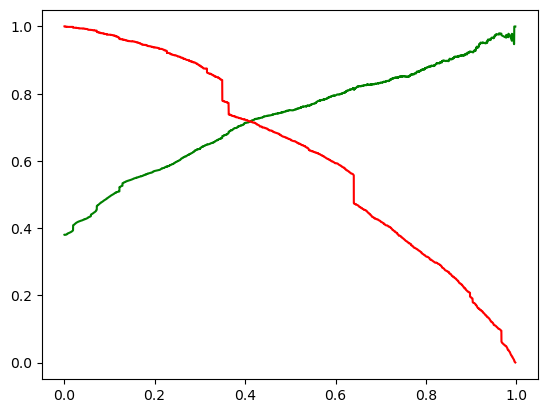

In [160]:
# Plotting the precision recall curve
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

## Predictions on Test Set

In [161]:
# Checking the columns in the X test set
X_test.columns

Index(['TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit',
       'Lead Origin_Landing Page Submission', 'Lead Origin_Lead Add Form',
       'Lead Origin_Lead Import', 'Lead Source_Direct Traffic',
       'Lead Source_Facebook', 'Lead Source_Google', 'Lead Source_Live Chat',
       'Lead Source_NC_EDM', 'Lead Source_Olark Chat',
       'Lead Source_Organic Search', 'Lead Source_Pay per Click Ads',
       'Lead Source_Press_Release', 'Lead Source_Reference',
       'Lead Source_Referral Sites', 'Lead Source_Social Media',
       'Lead Source_WeLearn', 'Lead Source_Welingak Website',
       'Lead Source_bing', 'Lead Source_blog', 'Lead Source_google',
       'Lead Source_testone', 'Lead Source_welearnblog_Home',
       'Lead Source_youtubechannel', 'Last Activity_Converted to Lead',
       'Last Activity_Email Bounced', 'Last Activity_Email Link Clicked',
       'Last Activity_Email Marked Spam', 'Last Activity_Email Opened',
       'Last Activity_Email Received',
     

In [162]:
# Check the test data frame
X_test.head()

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,Lead Source_Live Chat,...,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked
2012,2.0,1017,2.0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
5587,0.0,0,0.0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6850,9.0,540,9.0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
5231,0.0,0,0.0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
9046,7.0,1346,7.0,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [163]:
# Statistical analysis of the test data frame
X_test.describe()

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,Lead Source_Live Chat,...,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked
count,2723.000000,2723.000000,2723.000000,2723.000000,2723.000000,2723.000000,2723.000000,2723.000000,2723.000000,2723.000000,...,2723.0,2723.000000,2723.000000,2723.000000,2723.000000,2723.0,2723.000000,2723.000000,2723.000000,2723.0
mean,3.443996,484.840250,2.422046,0.544987,0.063166,0.004407,0.280940,0.004407,0.320970,0.000367,...,0.0,0.001836,0.365406,0.018362,0.030114,0.0,0.235035,0.005141,0.005509,0.0
std,3.550424,550.889285,2.115966,0.498064,0.243305,0.066250,0.449541,0.066250,0.466935,0.019164,...,0.0,0.042820,0.481632,0.134282,0.170932,0.0,0.424099,0.071532,0.074029,0.0
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0
25%,1.000000,14.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0
50%,3.000000,247.000000,2.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0
75%,5.000000,913.500000,3.500000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,...,0.0,0.000000,1.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0
max,43.000000,2272.000000,16.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,0.0,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,0.0


In [164]:
# Transform the test set using minmax scaler to scale the numerical columns 
X_test[num_col] = scaler.transform(X_test[num_col])

In [165]:
# Verify the scaled values
X_test.describe()

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,Lead Source_Live Chat,...,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked
count,2723.000000,2723.000000,2723.000000,2723.000000,2723.000000,2723.000000,2723.000000,2723.000000,2723.000000,2723.000000,...,2723.0,2723.000000,2723.000000,2723.000000,2723.000000,2723.0,2723.000000,2723.000000,2723.000000,2723.0
mean,0.013721,0.217808,0.044037,0.544987,0.063166,0.004407,0.280940,0.004407,0.320970,0.000367,...,0.0,0.001836,0.365406,0.018362,0.030114,0.0,0.235035,0.005141,0.005509,0.0
std,0.014145,0.247479,0.038472,0.498064,0.243305,0.066250,0.449541,0.066250,0.466935,0.019164,...,0.0,0.042820,0.481632,0.134282,0.170932,0.0,0.424099,0.071532,0.074029,0.0
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0
25%,0.003984,0.006289,0.018182,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0
50%,0.011952,0.110961,0.036364,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0
75%,0.019920,0.410377,0.063636,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,...,0.0,0.000000,1.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0
max,0.171315,1.020665,0.290909,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,0.0,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,0.0


In [166]:
# Keeping only the necessary columns as per the final model
col = X_train.columns
col = list(col)
X_test = X_test[col]
X_test.columns

Index(['TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit',
       'Last Activity_Converted to Lead', 'Last Activity_Email Bounced',
       'Last Activity_Olark Chat Conversation',
       'Last Activity_Page Visited on Website', 'Last Activity_Unsubscribed',
       'What is your current occupation_No Occupation chosen',
       'What is your current occupation_Working Professional',
       'Last Notable Activity_Email Link Clicked',
       'Last Notable Activity_Email Opened', 'Last Notable Activity_Modified'],
      dtype='object')

In [167]:
# Add constant ot the X_test dataframe
X_test_sm = sm.add_constant(X_test)

In [168]:
# Check the addition of constant
X_test_sm.head()

,const,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity_Converted to Lead,Last Activity_Email Bounced,Last Activity_Olark Chat Conversation,Last Activity_Page Visited on Website,Last Activity_Unsubscribed,What is your current occupation_No Occupation chosen,What is your current occupation_Working Professional,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Opened,Last Notable Activity_Modified
2012,1.0,0.007968,0.456873,0.036364,0,0,0,0,0,0,0,0,1,0
5587,1.0,0.000000,0.000000,0.000000,0,0,0,0,0,1,0,0,1,0
6850,1.0,0.035857,0.242588,0.163636,0,0,0,0,0,0,0,0,0,0
5231,1.0,0.000000,0.000000,0.000000,0,0,0,0,0,1,0,0,0,0
9046,1.0,0.027888,0.604672,0.127273,0,0,0,0,0,0,0,0,1,0


In [169]:
# Calculate the probabilities of conversion using the final model (Model 7)
y_test_pred = lgr_model7.predict(X_test_sm)

In [170]:
# Display first 10 rows
y_test_pred[:10]

2012    0.631674
5587    0.122275
6850    0.294638
5231    0.315857
9046    0.445666
220     0.902765
1029    0.019787
8190    0.640379
8046    0.191927
6373    0.640379
dtype: float64

In [171]:
# Converting y_test_pred (an array) to a dataframe 
y_pred_1 = pd.DataFrame(y_test_pred)

In [172]:
# Check the dataframe
y_pred_1.head()

,0
2012,0.631674
5587,0.122275
6850,0.294638
5231,0.315857
9046,0.445666


In [173]:
# Converting y_test (the initial split data) to a dataframe
y_test_df = pd.DataFrame(y_test)

# Add a column ID to index
y_test_df['Id'] = y_test_df.index

# Removing index for both dataframes to append them side by side 
y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

In [174]:
# Concat both y_test_df and y_pred_1
y_pred_final = pd.concat([y_test_df, y_pred_1],axis=1)

y_pred_final.head()

,Converted,Id,0
0,1,2012,0.631674
1,0,5587,0.122275
2,0,6850,0.294638
3,1,5231,0.315857
4,1,9046,0.445666


In [175]:
# Renaming the columns accordingly
y_pred_final= y_pred_final.rename(columns={ 0 : 'Converted_Prob'})

# Rearranging the columns
y_pred_final = y_pred_final[['Id','Converted','Converted_Prob']]

In [176]:
# Let's see the head of y_pred_final
y_pred_final.head()

,Id,Converted,Converted_Prob
0,2012,1,0.631674
1,5587,0,0.122275
2,6850,0,0.294638
3,5231,1,0.315857
4,9046,1,0.445666


In [177]:
# Adding a final column to the dataframe which tell the final predicted values based on the 
# optimal cutoff point
y_pred_final['final_predicted'] = y_pred_final.Converted_Prob.map(lambda x: 1 if x > 0.34 else 0)

In [178]:
# Check the data frame
y_pred_final.head()

,Id,Converted,Converted_Prob,final_predicted
0,2012,1,0.631674,1
1,5587,0,0.122275,0
2,6850,0,0.294638,0
3,5231,1,0.315857,0
4,9046,1,0.445666,1


###### Observation:
We have the probability, predicted values and the Converted values from the data set

## Model Evaluation

In [179]:
# Checking the overall accuracy.
metrics.accuracy_score(y_pred_final.Converted, y_pred_final.final_predicted)

0.7785530664708042

In [180]:
# Confusion matrix for the test data
confusion2 = metrics.confusion_matrix(y_pred_final.Converted, y_pred_final.final_predicted )
confusion2

array([[1264,  437],
       [ 166,  856]], dtype=int64)

In [181]:
# Assigning values from the confusion matrix
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [182]:
# Calculating the sensitivity of our logistic regression model on the test data
TP / float(TP+FN)

0.837573385518591

In [183]:
# Calculating specificity
TN / float(TN+FP)

0.7430922986478542

###### Observation:
    
Accuracy of Train data at optimal cutoff point 0.34:77.81%
Accuracy of Test data at optimal cutoff point 0.34: 77.85%

Sensitivity of Train data at optimal cutoff point 0.34:84.66%
Sensitivity of Test data at optimal cutoff point 0.34: 83.75%

Specificity of Train data at optimal cutoff point 0.34: 73.61%
Specificity of Test data at optimal cutoff point 0.34 : 74.30%
    
Precision:74.9%
Recall:66.3%

In [184]:
print("Columns in the final model: \n",X_test.columns)

Columns in the final model: 
 Index(['TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit',
       'Last Activity_Converted to Lead', 'Last Activity_Email Bounced',
       'Last Activity_Olark Chat Conversation',
       'Last Activity_Page Visited on Website', 'Last Activity_Unsubscribed',
       'What is your current occupation_No Occupation chosen',
       'What is your current occupation_Working Professional',
       'Last Notable Activity_Email Link Clicked',
       'Last Notable Activity_Email Opened', 'Last Notable Activity_Modified'],
      dtype='object')


###### Conclusion:
A probability of 0.34 or more can be considered a hot lead to get a better conversion rate.
Working Professionals are more likely to convert.
Users who have spent more time on the website are likely to convert.
Users with more number of visits to the website are more likely to convert.
Users who have not mentioned their current occupation are not likely to convert.
Users who have unsubscribed and whose emails are bouncing are not likely to convert.

Recommendation:
The sales team should focus on working professionals who visit the website often and spend more time on the website
